In [1]:
%pip install seaborn
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import pandas as pd
import seaborn as sns
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    make_scorer
)

torch.set_default_dtype(torch.float32)

Note: you may need to restart the kernel to use updated packages.


COLOUR PALETTE


In [2]:
blue_palette = {
    "navy_1": "#001a33",
    "navy_2": "#003366",
    "blue_1": "#004080",
    "blue_2": "#0059b3",
    "blue_3": "#0066cc",
    "pastel_1": "#b8d4f0",
    "pastel_2": "#6fa8dc",
    "grid": "#c8d8e8",
    "text": "#001a33"
}

def style_blue_axes(ax):
    ax.set_facecolor("white")

    ax.title.set_color(blue_palette["text"])
    ax.xaxis.label.set_color(blue_palette["text"])
    ax.yaxis.label.set_color(blue_palette["text"])

    ax.tick_params(
        axis="both",
        colors=blue_palette["navy_2"],
        labelsize=9
    )

    ax.spines["bottom"].set_color(blue_palette["navy_2"])
    ax.spines["left"].set_color(blue_palette["navy_2"])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.grid(
        True,
        color=blue_palette["grid"],
        alpha=0.45,
        linewidth=0.8
    )

LOAD DATASET

In [3]:
df=pd.read_csv('train.csv')
#9 inputs 19 outputs
X_train=np.array(df.iloc[:,:9])
y_train=np.array(df.iloc[:,9:])

df=pd.read_csv('test.csv')

X_test=np.array(df.iloc[:,:9])
y_test=np.array(df.iloc[:,9:])

names=df.columns

n_inputs=X_train.shape[1]
n_outputs=y_train.shape[1]

input_names=names[:9]
output_names=names[9:]

print(output_names)

Index(['Q1_MW', 'Q2_MW', 'T_reactor_out', 'X_CO', 'T3', 'P3', 'n3_total',
       'y_CO_3', 'y_H2_3', 'y_MeOH_3', 'y_H2O_3', 'P4', 'n4_total', 'x_CO_4',
       'x_H2_4', 'x_MeOH_4', 'x_H2O_4', 'MeOH_recovery',
       'MeOH_purity_stream4'],
      dtype='str')


PLOTTING

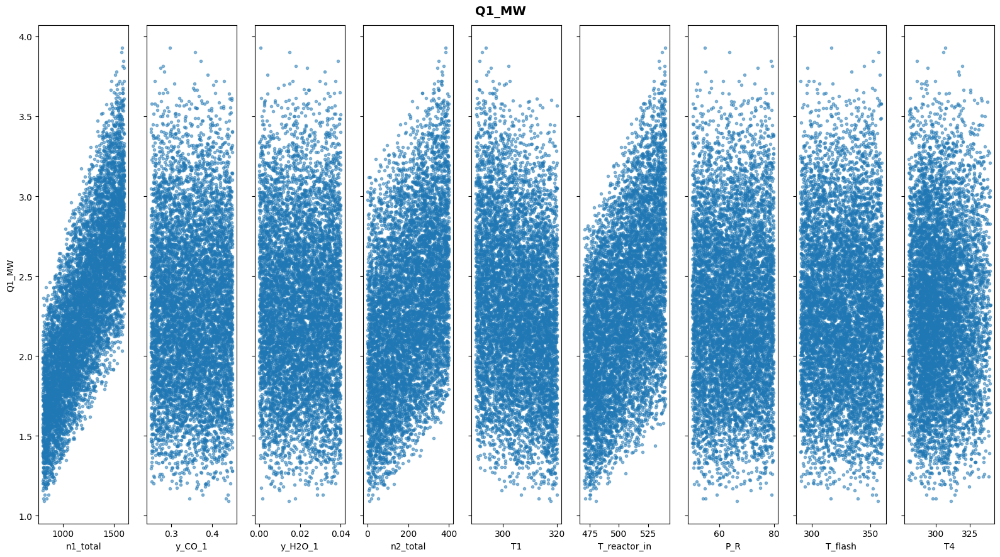

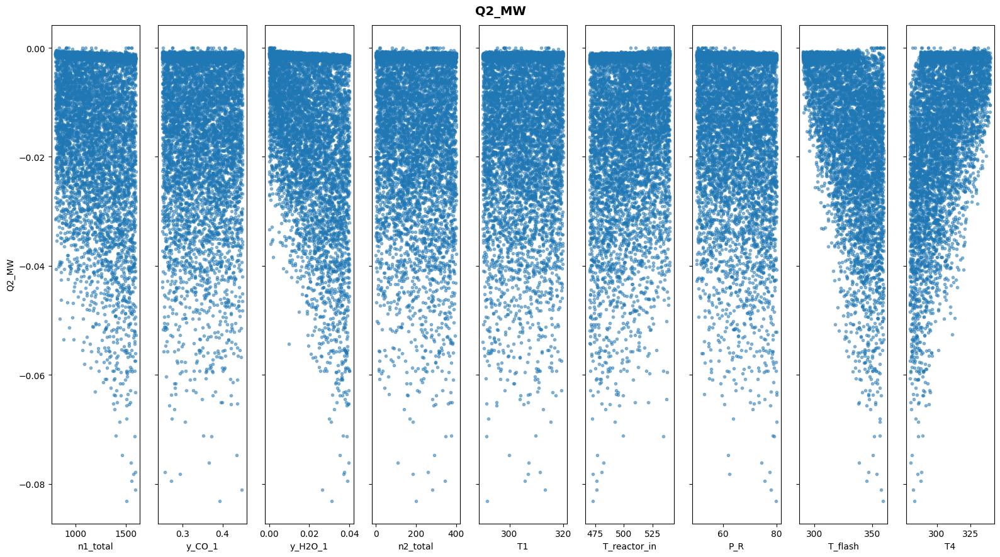

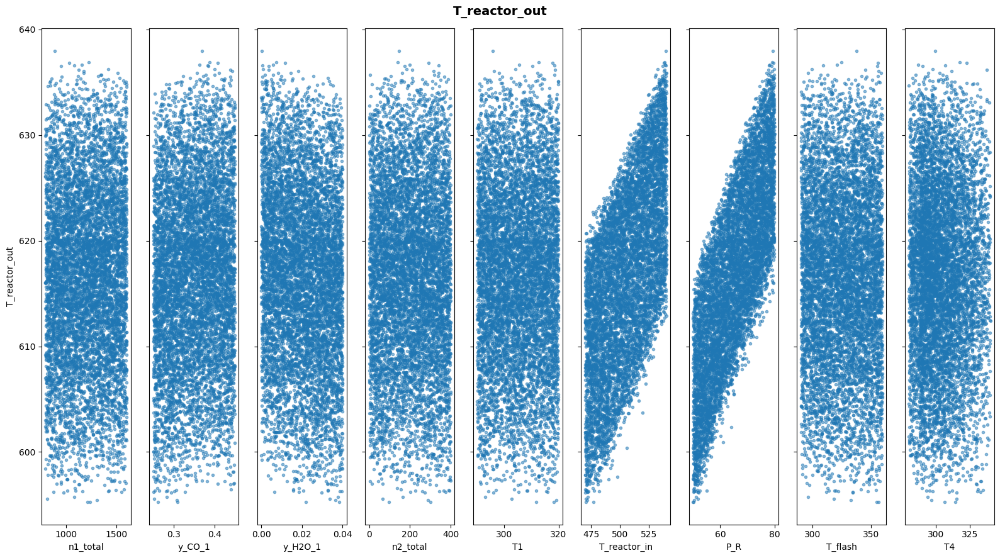

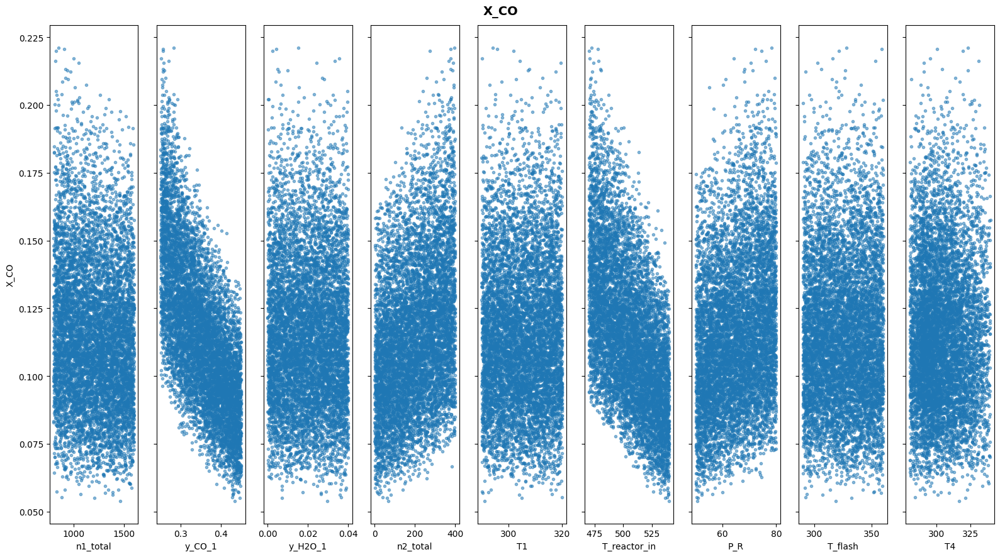

In [ ]:
for i in range(y_train.shape[1]):  
    fig, ax = plt.subplots(1, X_train.shape[1], figsize=(16,9), sharey=True)
    
    fig.suptitle(f'{output_names[i]}', fontsize=14, fontweight='bold')
    
    for j in range(X_train.shape[1]):
        ax[j].scatter(X_train[:,j], y_train[:,i], marker='.', alpha=0.5)
        ax[j].set_xlabel(input_names[j])
        
        if j == 0:
            ax[j].set_ylabel(output_names[i])
            
    plt.tight_layout()
    plt.show()

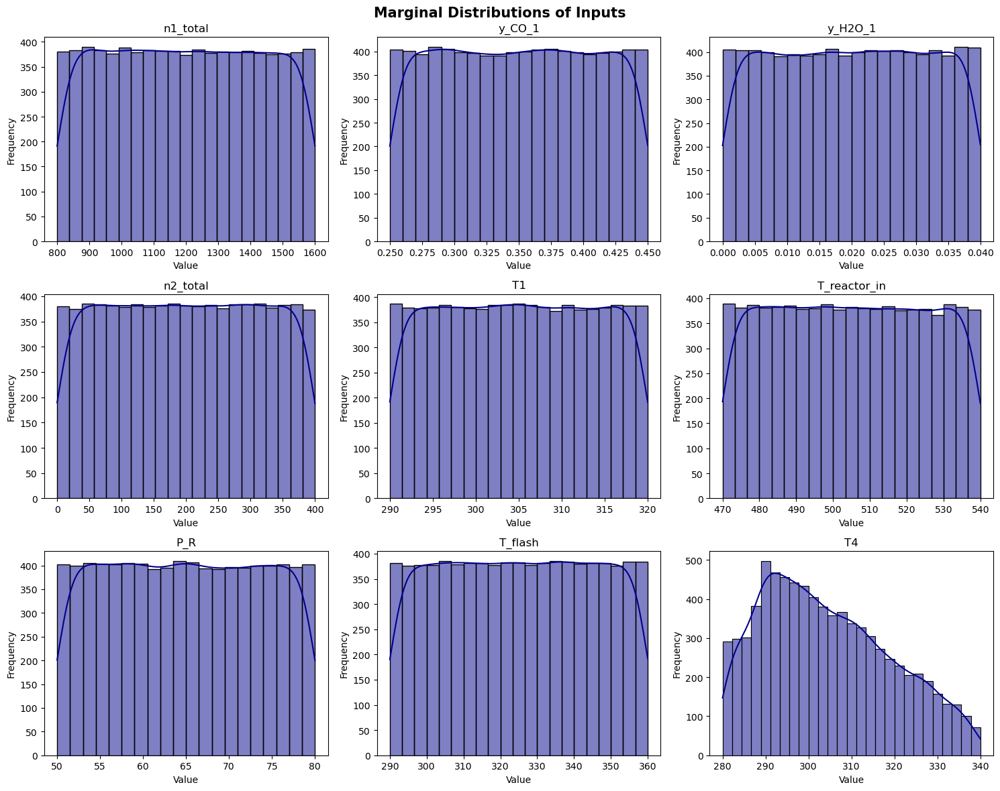

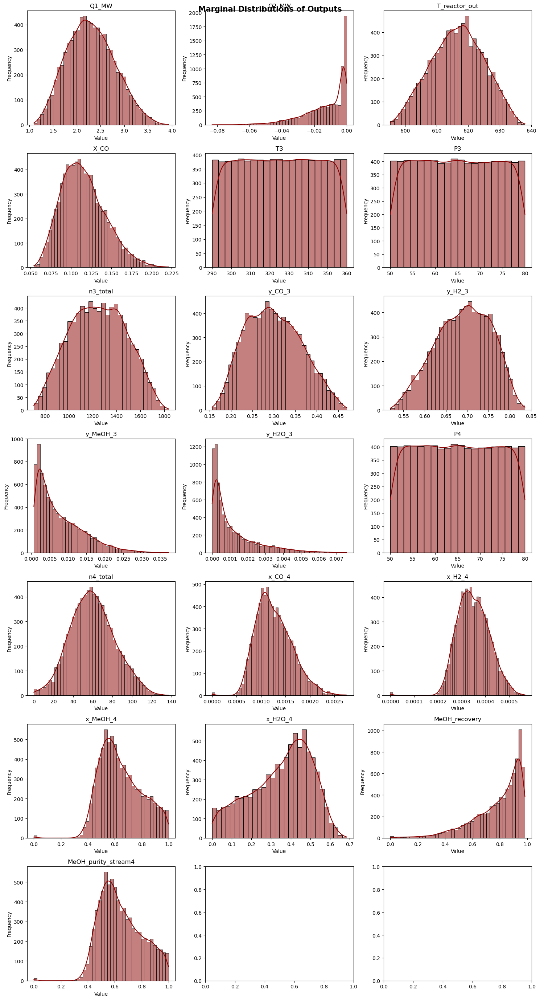

In [ ]:
# --- input distributions ---
cols = 3
rows = math.ceil(X_train.shape[1] / cols)
fig, axes = plt.subplots(rows, cols, figsize=(15, 4*rows))
fig.suptitle("Marginal Distributions of Inputs", fontsize=15, fontweight='bold')

for i in range(X_train.shape[1]):
    ax = axes.flatten()[i]
    sns.histplot(X_train[:, i], kde=True, ax=ax, color='darkblue')
    
    ax.set_title(input_names[i])
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# --- output distributions ---
cols = 3
rows = math.ceil(y_train.shape[1] / cols)
fig, axes = plt.subplots(rows, cols, figsize=(15, 4*rows))
fig.suptitle("Marginal Distributions of Outputs", fontsize=15, fontweight='bold')
for i in range(y_train.shape[1]):
    ax= axes.flatten()[i]
    sns.histplot(y_train[:, i], kde=True, ax=ax, color='darkred')
    ax.set_title(output_names[i])  
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()
    


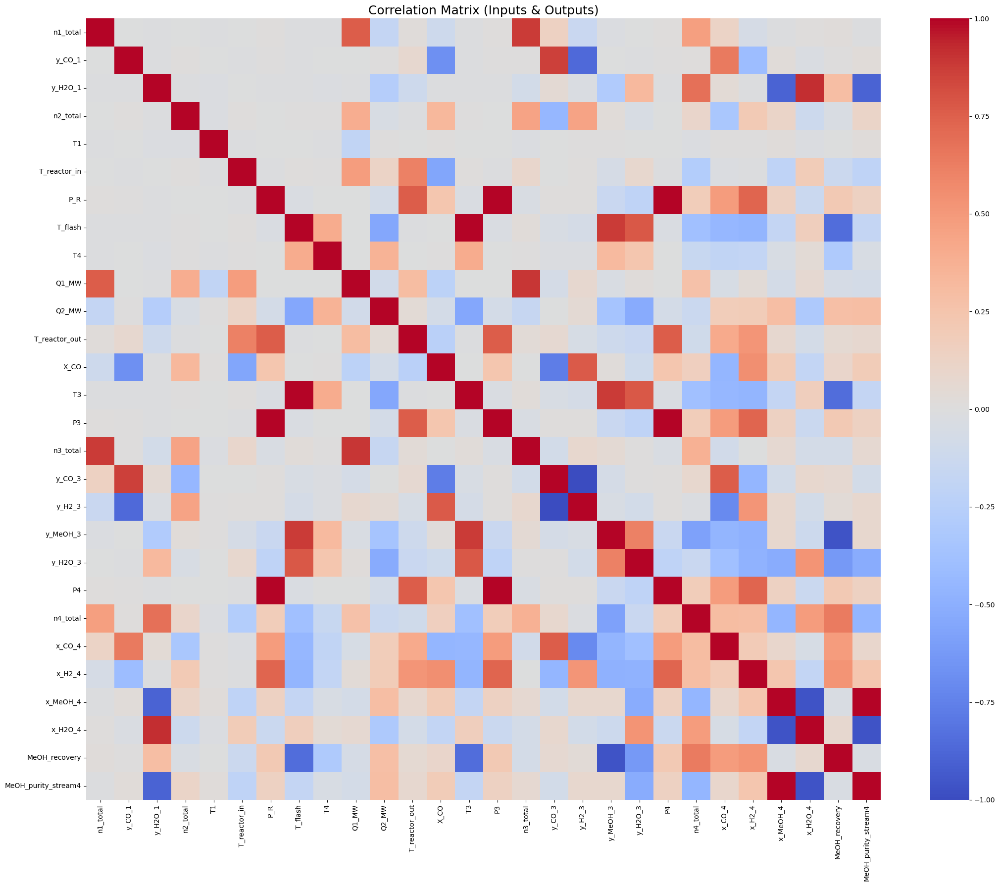

In [ ]:
#Correlation heat matrix
df_X = pd.DataFrame(X_train, columns=input_names)
df_y = pd.DataFrame(y_train, columns=output_names)
df_all = pd.concat([df_X, df_y], axis=1)

corr_matrix = df_all.corr() # corretlation matrix

plt.figure(figsize=(22, 18))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title("Correlation Matrix (Inputs & Outputs)", fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
# check if some of the variables are almost constant so that we'll be able to remove them
# from the neural network training, since they won't provide any useful information to the model
variances = df_y.var()
stdevs = df_y.std()

print("Variance of outputs:")
for out_name, var, std in zip(output_names, variances, stdevs):
    # if variance is almost zwero the output is const
    if var < 1e-4:
        print(f"⚠️ {out_name} is almost constant (Var: {var:.2e}, Std: {std:.2e})")

Variance of outputs:
⚠️ y_MeOH_3 is almost constant (Var: 3.89e-05, Std: 6.24e-03)
⚠️ y_H2O_3 is almost constant (Var: 1.72e-06, Std: 1.31e-03)
⚠️ x_CO_4 is almost constant (Var: 1.34e-07, Std: 3.66e-04)
⚠️ x_H2_4 is almost constant (Var: 4.37e-09, Std: 6.61e-05)


MULTILINEAR REGRESSION

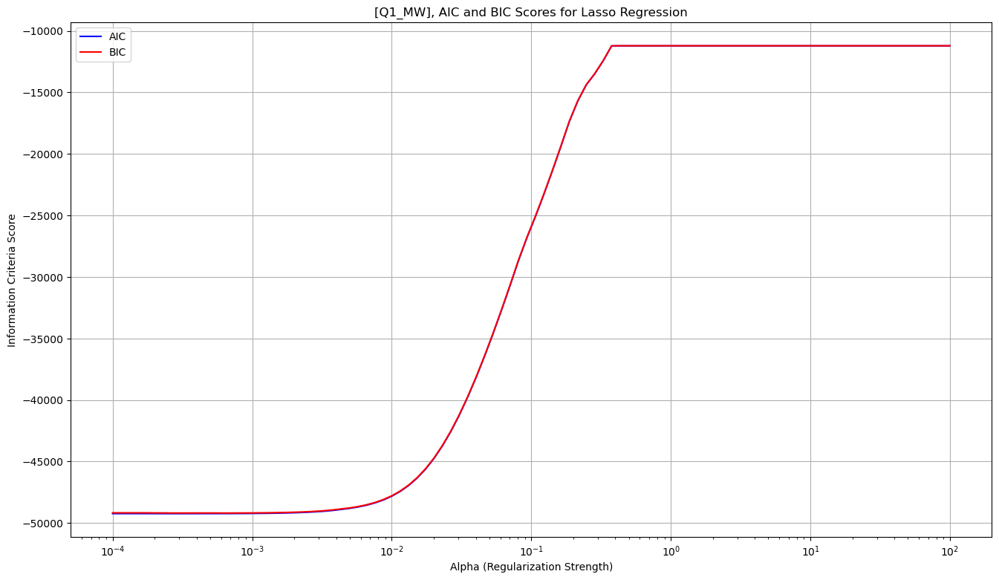

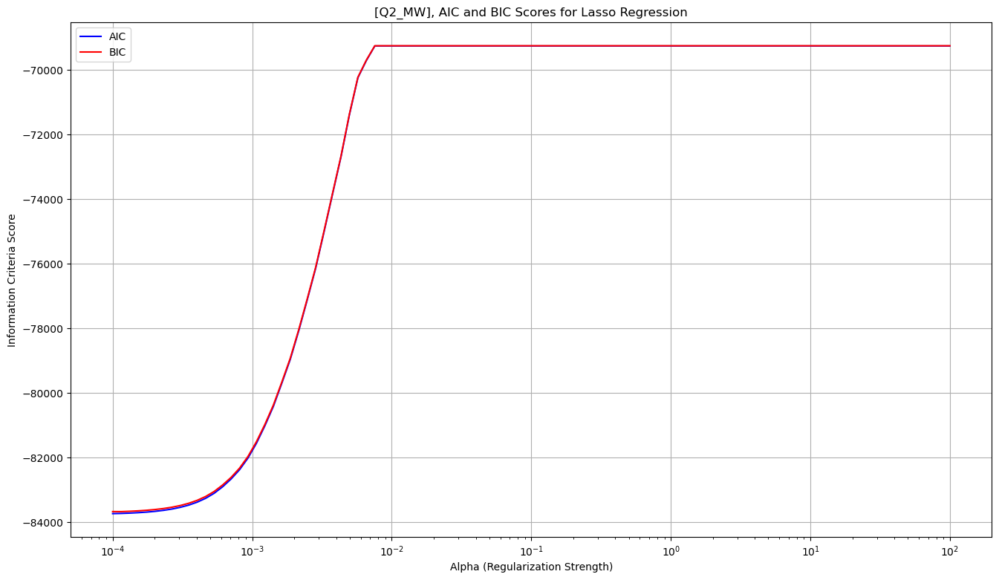

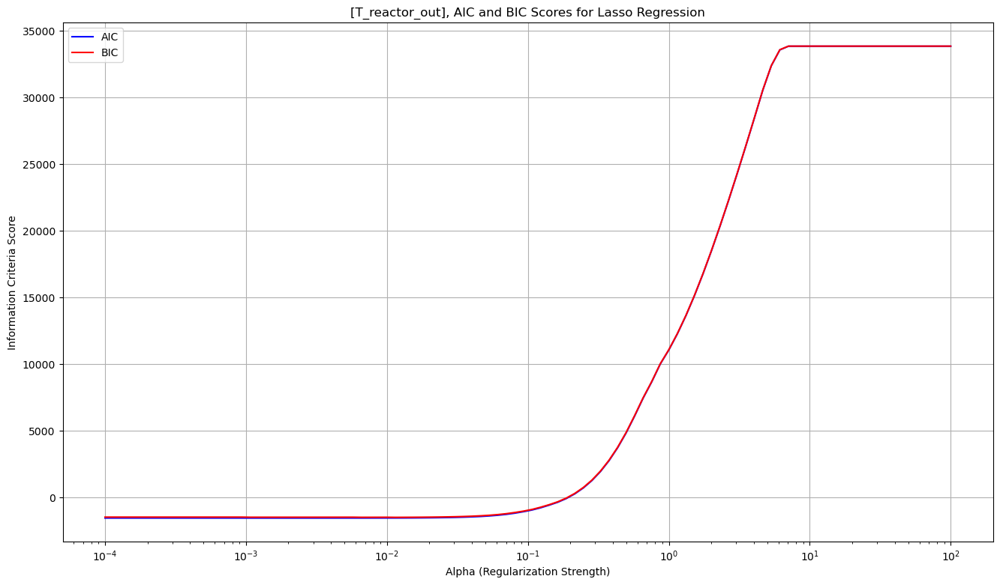

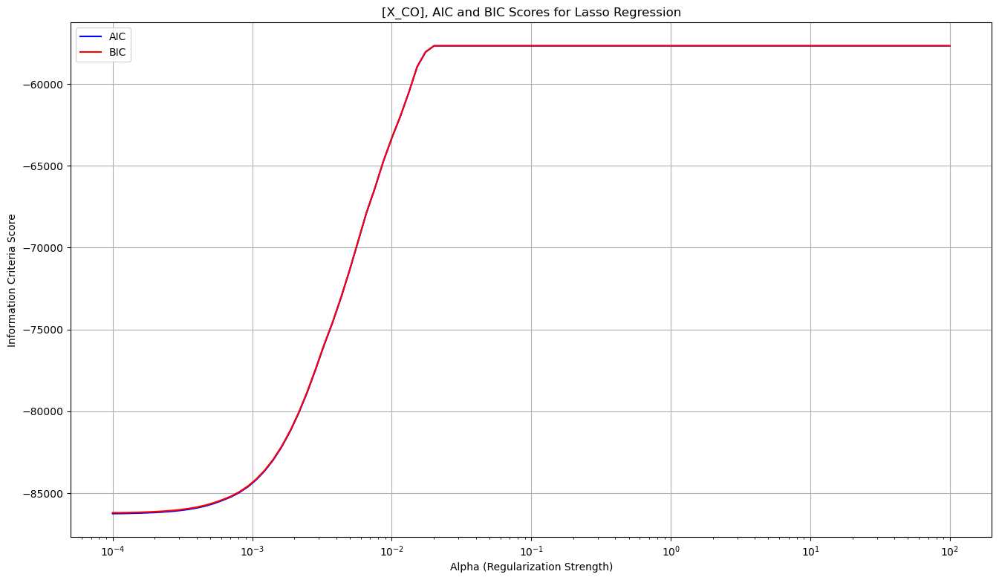

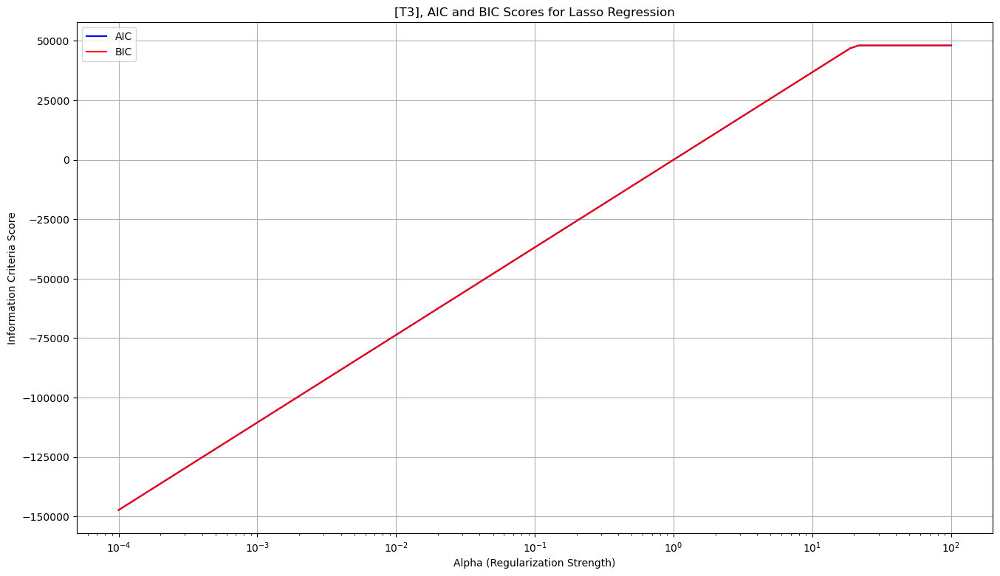

...

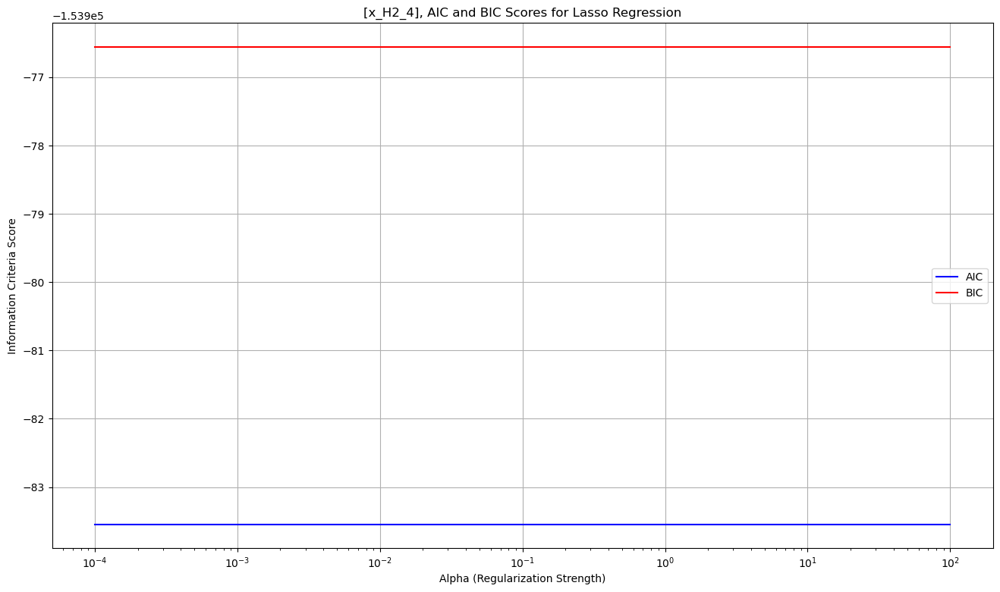

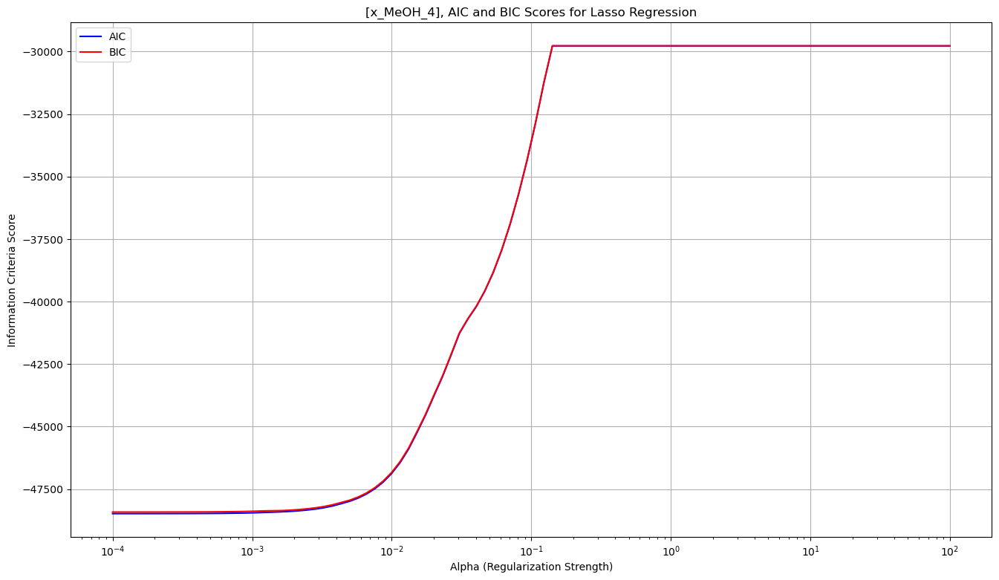

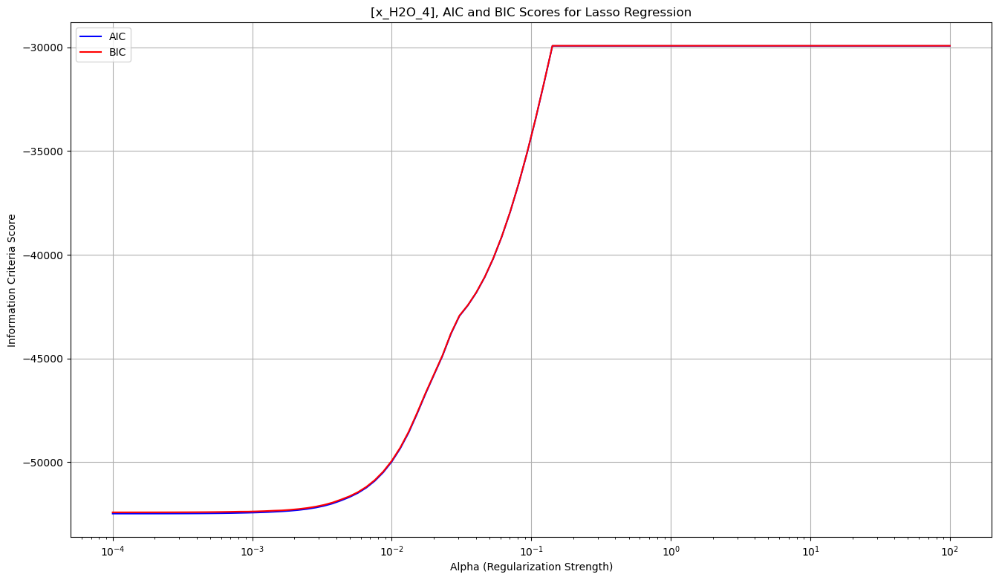

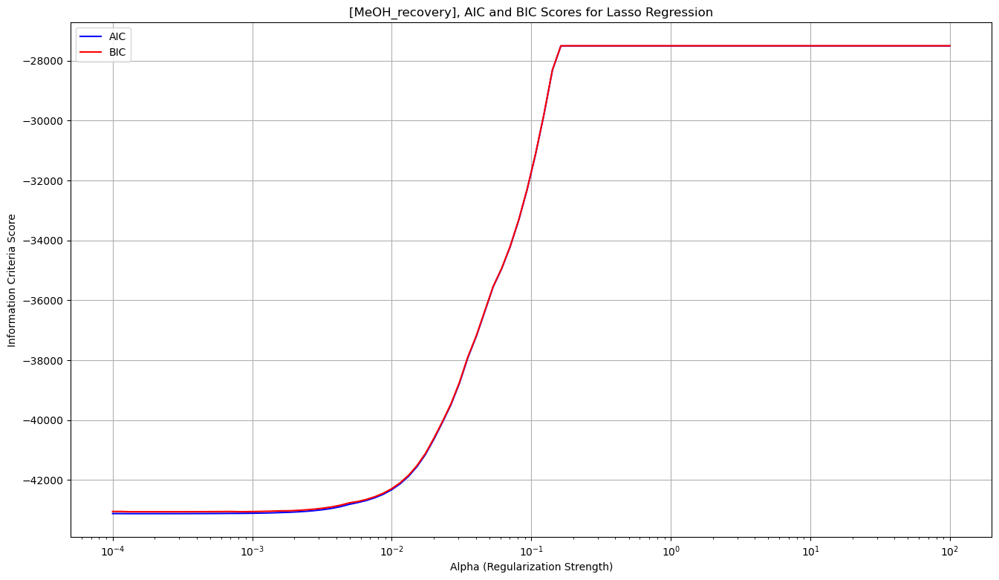

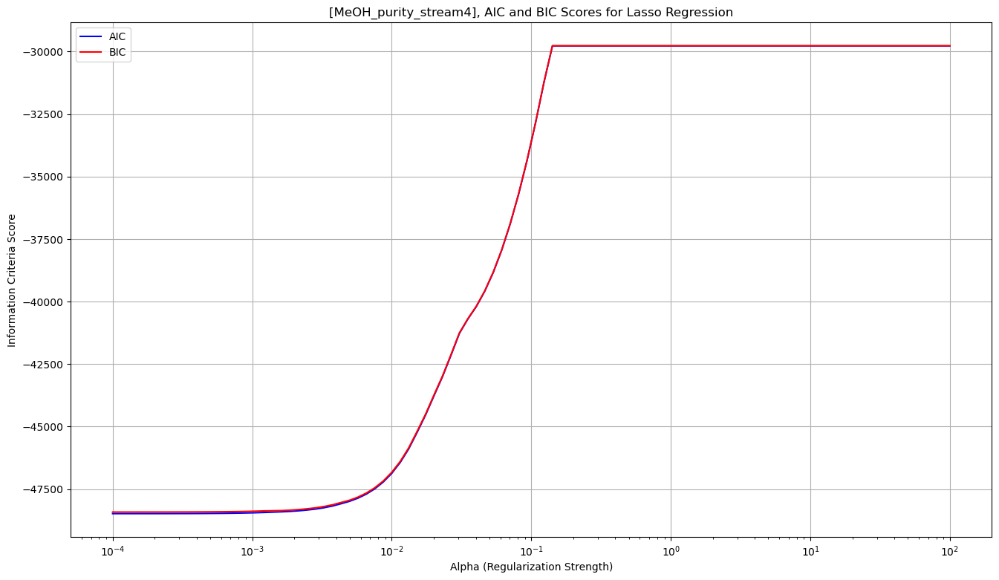

"\nalpha=1e-3\n\nlasso=Lasso(alpha=alpha)\nlasso.fit(X_train_n,y_train[:,0])\ncoefficients=lasso.coef_\nprint(coefficients)\ny_pred=lasso.predict(X_train_n)\n\n\n\nfig,ax =plt.subplots(1,2)\n\nax[0].scatter(y_train[:,0],y_pred,marker='.')\nax[0].set_xlabel('True Values')\nax[0].set_ylabel('Predicted Values')\nplt.show()\n"

In [ ]:
X_avg=np.mean(X_train,axis=0)
X_std=np.std(X_train,axis=0)
X_train_n=(X_train-X_avg)/X_std

def AIC(y_true, y_pred, k):
    # AIC = n * log(RSS/n) + 2k
    n = len(y_true)
    rss = ((y_true - y_pred) ** 2).sum()
    return n * np.log(rss / n) + 2 * k

def BIC(y_true, y_pred, k):
    # BIC = n * log(RSS/n) + k * log(n)
    n = len(y_true)
    rss = ((y_true - y_pred) ** 2).sum()
    return n * np.log(rss / n) + k * np.log(n)


alphas = np.logspace(-4, 2, 100)
for i,output in enumerate(output_names):
    scores_aic = []
    scores_bic = []
    for alpha in alphas:
        lasso = Lasso(alpha=alpha)
        lasso.fit(X_train_n, y_train[:,i])
        y_pred = lasso.predict(X_train_n)
        k = np.sum(lasso.coef_ != 0) + 1  # non-zero features + intercept
        scores_aic.append(AIC(y_train[:,i], y_pred, k))
        scores_bic.append(BIC(y_train[:,i], y_pred, k))
        
    plt.figure(i,figsize=(16, 9))
    plt.plot(alphas, scores_aic, label='AIC', color='blue')
    plt.plot(alphas, scores_bic, label='BIC', color='red')
    #plt.plot(alphas, np.sqrt([scores_aic[j] * scores_bic[j] for j in range(len(alphas))]),
    #     label='Geometric Mean (AIC*BIC)^0.5', color='green')
    plt.xscale('log')
    plt.xlabel('Alpha (Regularization Strength)')
    plt.ylabel('Information Criteria Score')
    plt.title(f'[{output}], AIC and BIC Scores for Lasso Regression')
    plt.legend()
    plt.grid()
plt.show() 


'''
alpha=1e-3

lasso=Lasso(alpha=alpha)
lasso.fit(X_train_n,y_train[:,0])
coefficients=lasso.coef_
print(coefficients)
y_pred=lasso.predict(X_train_n)



fig,ax =plt.subplots(1,2)

ax[0].scatter(y_train[:,0],y_pred,marker='.')
ax[0].set_xlabel('True Values')
ax[0].set_ylabel('Predicted Values')
plt.show()
'''

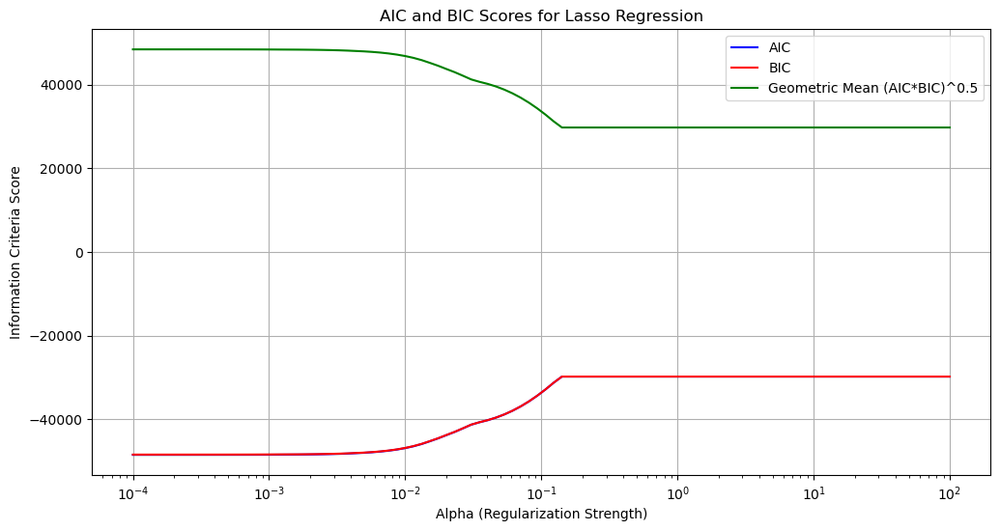

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(alphas, scores_aic, label='AIC', color='blue')
plt.plot(alphas, scores_bic, label='BIC', color='red')
plt.plot(alphas, np.sqrt([scores_aic[i] * scores_bic[i] for i in range(len(alphas))]),
         label='Geometric Mean (AIC*BIC)^0.5', color='green')
plt.xscale('log')
plt.xlabel('Alpha (Regularization Strength)')
plt.ylabel('Information Criteria Score')
plt.title('AIC and BIC Scores for Lasso Regression')
plt.legend()
plt.grid()
plt.show()

NN TRAIN

NN CREATION

In [ ]:
X_scaler=StandardScaler()
y_scaler=StandardScaler()

X_train_scaled=X_scaler.fit_transform(X_train)
X_test_scaled=X_scaler.transform(X_test)

y_train_scaled=y_scaler.fit_transform(y_train)
y_test_scaled=y_scaler.transform(y_test)

X_train_t=torch.tensor(X_train_scaled,dtype=torch.float32)
y_train_t=torch.tensor(y_train_scaled,dtype=torch.float32)

X_test_t=torch.tensor(X_test_scaled,dtype=torch.float32)
y_test_t=torch.tensor(y_test_scaled,dtype=torch.float32)

train_loader=DataLoader(TensorDataset(X_train_t,y_train_t), batch_size=32, shuffle=True)

In [ ]:
net=nn.Sequential(
    nn.Linear(9,124),
    nn.Tanh(),
    nn.Linear(124,124),
    nn.Tanh(),
    nn.Linear(124,124),
    nn.Tanh(),
    nn.Linear(124,19),
)
criterion=nn.MSELoss()

optimizer=torch.optim.Adam(net.parameters())

In [ ]:
n_epochs=50

net.train()

history_acc=[]
for epoch in range(n_epochs):
    correct=0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad() #We eliminate gradients to have the batches fully independent from each other
        #['Q1_MW', 'Q2_MW', 'T_reactor_out', 'X_CO', 'T3', 'P3', 'n3_total',
        #'y_CO_3', 'y_H2_3', 'y_MeOH_3', 'y_H2O_3', 'P4', 'n4_total', 'x_CO_4',
        #'x_H2_4', 'x_MeOH_4', 'x_H2O_4', 'MeOH_recovery',
        #'MeOH_purity_stream4'] 3,7,8,9,10,13,14,15,16,17
        raw_out = net(X_batch)

        out = raw_out.clone()
        '''
        # Single variables bounded between 0 and 1
        bounded_idx = [3, 17, 18]   # X_CO, MeOH_recovery, MeOH_purity_stream4
        out[:, bounded_idx] = torch.sigmoid(raw_out[:, bounded_idx])

        # Gas molar fractions: y_CO_3, y_H2_3, y_MeOH_3, y_H2O_3
        gas_frac_idx = [7, 8, 9, 10]
        out[:, gas_frac_idx] = F.softmax(raw_out[:, gas_frac_idx], dim=1)

        # Liquid molar fractions: x_CO_4, x_H2_4, x_MeOH_4, x_H2O_4
        liquid_frac_idx = [13, 14, 15, 16]
        out[:, liquid_frac_idx] = F.softmax(raw_out[:, liquid_frac_idx], dim=1)
        '''
        
        loss=criterion(out,y_batch) #We compute the loss for each batch

        loss.backward() #We back-propagate the loss 

        optimizer.step() #We use the optimizer's algorithm to change the weights based on the loss function 

        predicted=out.argmax(dim=1)
        #correct += (predicted==y_batch).sum().item()

In [ ]:
net.eval()

with torch.no_grad():
    model=net(X_train_t).numpy()
    model=y_scaler.inverse_transform(model)
# Single variables bounded between 0 and 1


'''

bounded_idx = [3, 17, 18]   # X_CO, MeOH_recovery, MeOH_purity_stream4
out[:, bounded_idx] = torch.sigmoid(model[:, bounded_idx])

# Gas molar fractions: y_CO_3, y_H2_3, y_MeOH_3, y_H2O_3
gas_frac_idx = [7, 8, 9, 10]
out[:, gas_frac_idx] = F.softmax(model[:, gas_frac_idx], dim=1)

# Liquid molar fractions: x_CO_4, x_H2_4, x_MeOH_4, x_H2O_4
liquid_frac_idx = [13, 14, 15, 16]
out[:, liquid_frac_idx] = F.softmax(model[:, liquid_frac_idx], dim=1)
'''
#mask=y_train !=0
#train_error=abs((model[mask]-y_train[mask])/y_train[mask])*100
#print(train_error.shape)

NameError: name 'ì' is not defined

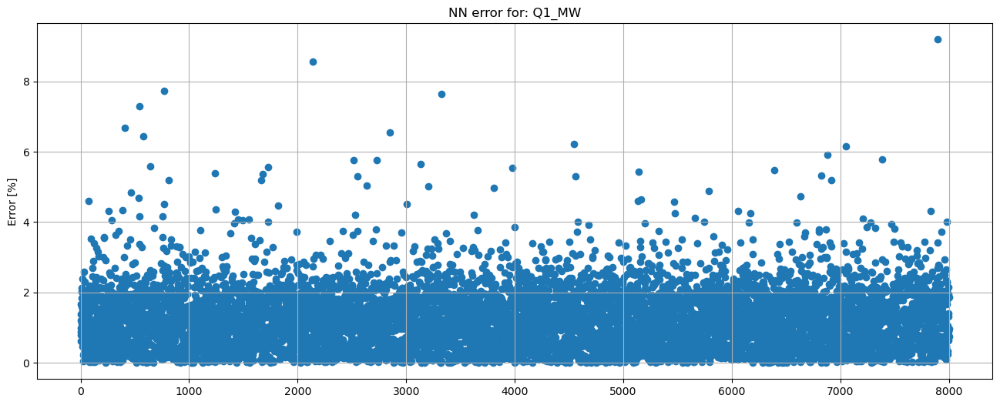

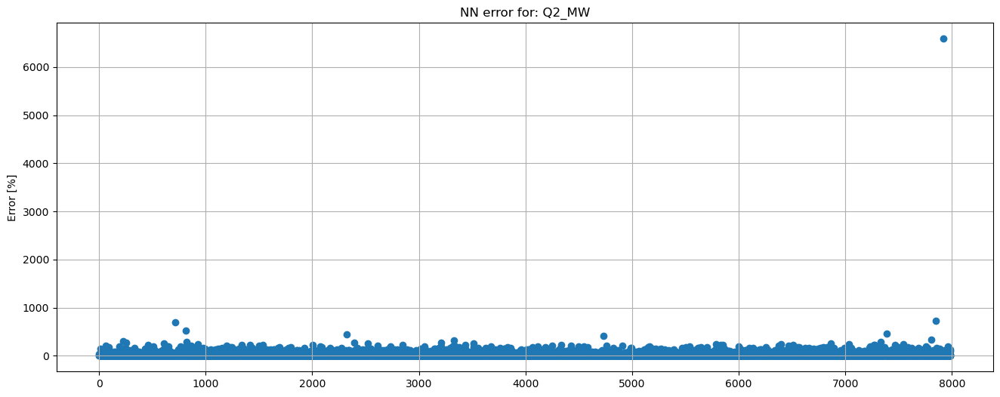

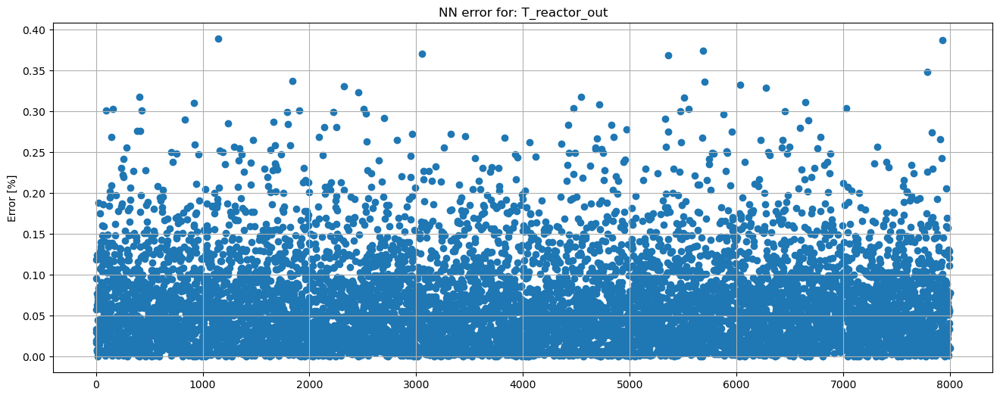

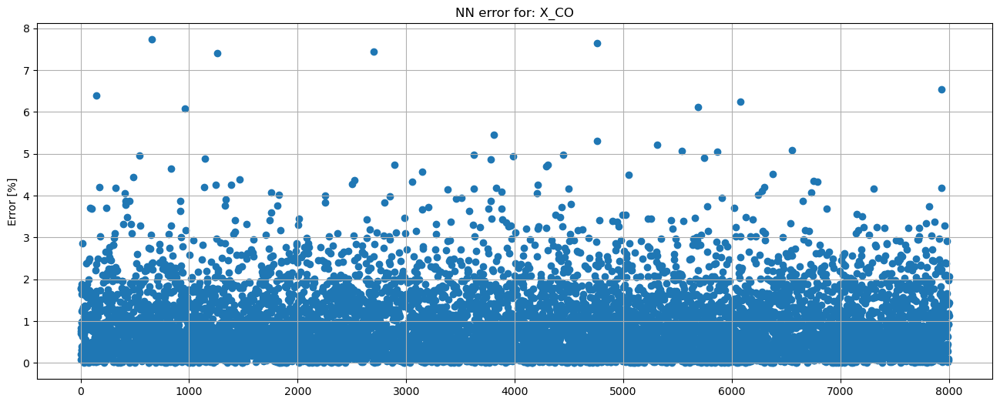

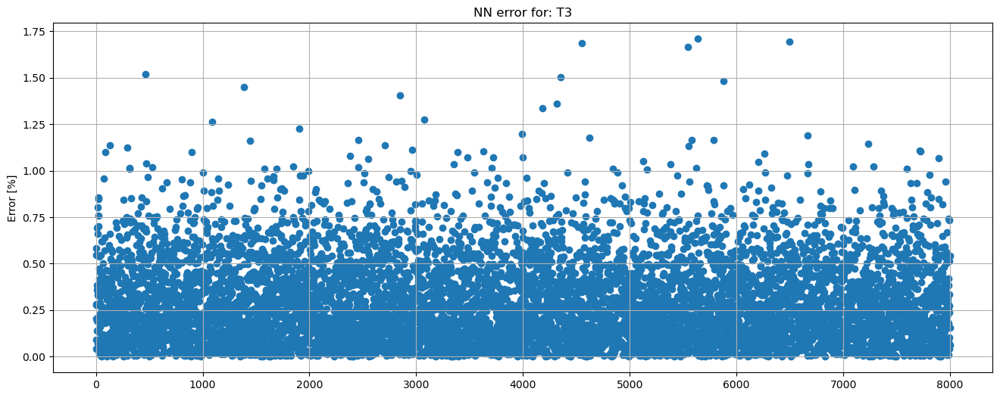

...

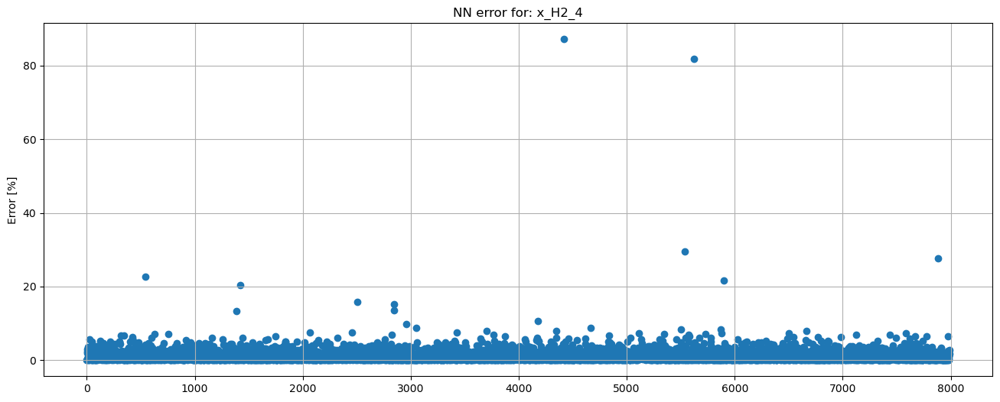

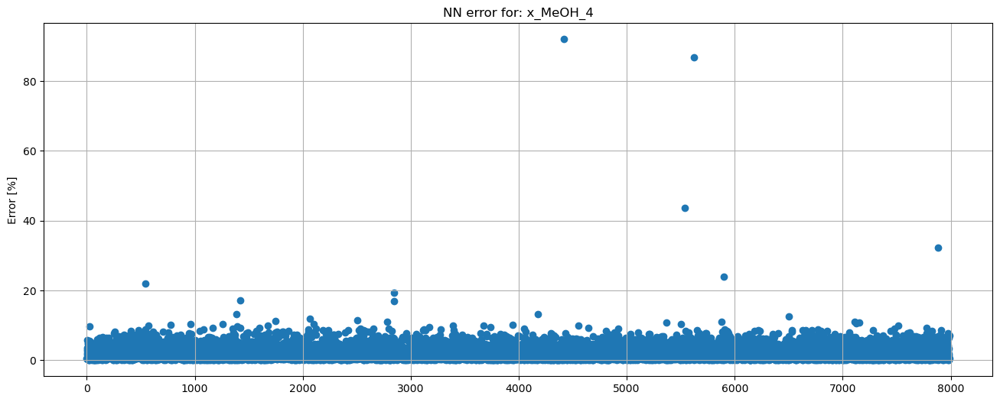

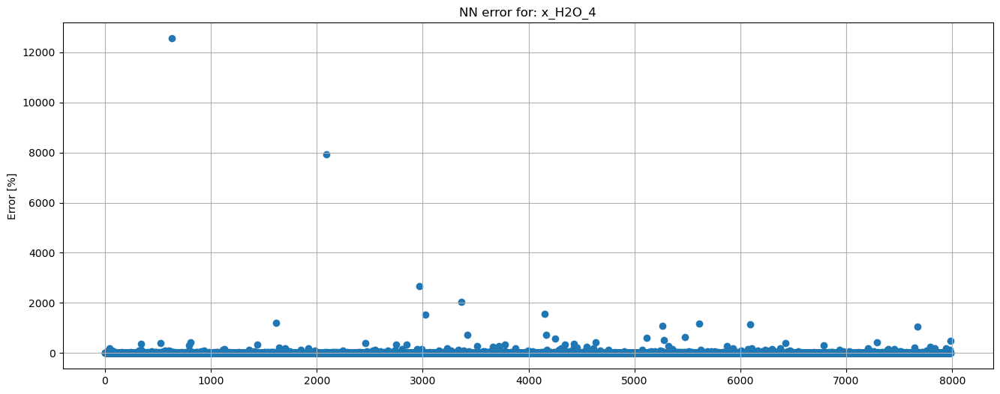

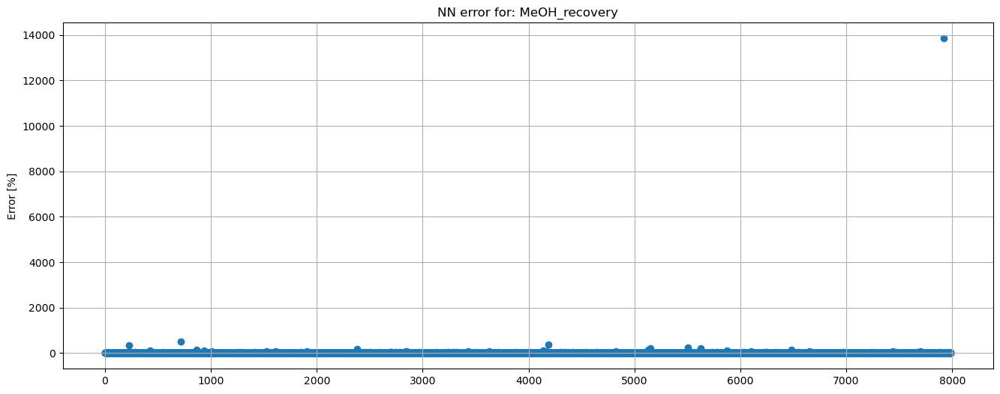

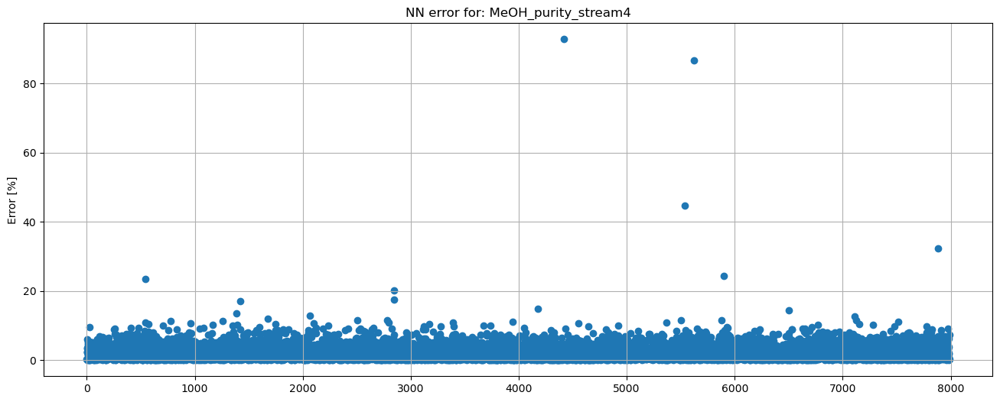

In [ ]:
#print(np.average(train_error,axis=0))
for i in range(y_train.shape[1]):
    mask=y_train[:,i] !=0
    train_error=abs((model[mask,i]-y_train[mask,i])/y_train[mask,i])*100
    plt.figure(i,figsize=(16,6))
    plt.title(f'NN error for: {output_names[i]}')
    plt.scatter(range(train_error.shape[0]),train_error)
    plt.grid(True)
    plt.ylabel('Error [%]')
plt.show()

POLYNOMINAL RIDGE REGRESSION 


Feature count per degree:


,Degree,Number of polynomial features
0,1,9
1,2,54
2,3,219


Best parameters:
{'regressor__poly__degree': 3, 'regressor__ridge__alpha': np.float64(0.0001)}

Best CV score:
-0.007794270955048049

Final Polynomial Ridge model trained on full train.csv
Polynomial degree: 3
Ridge alpha: 0.0001

Combined validation and test results:


,Output,MAE_val,MAE_test,RMSE_val,RMSE_test,R2_val,R2_test
0,Q1_MW,1.204400e-06,1.230930e-06,1.734630e-06,1.789650e-06,1.00000,1.00000
1,Q2_MW,1.767230e-04,1.888300e-04,2.857820e-04,3.495470e-04,0.99948,0.99926
2,T_reactor_out,1.958460e-02,1.843040e-02,2.842240e-02,2.619550e-02,0.99999,0.99999
3,X_CO,8.753190e-05,9.044310e-05,1.261820e-04,1.393670e-04,0.99998,0.99998
4,T3,1.091790e-06,8.523530e-07,1.434110e-06,1.128300e-06,1.00000,1.00000
5,P3,4.595370e-07,3.654860e-07,5.930450e-07,4.691640e-07,1.00000,1.00000
6,n3_total,1.935960e-01,1.950280e-01,3.506180e-01,3.658670e-01,1.00000,1.00000
7,y_CO_3,1.874000e-04,1.878800e-04,2.566600e-04,2.589420e-04,0.99998,0.99998
8,y_H2_3,2.097330e-04,2.024890e-04,3.068910e-04,2.907820e-04,0.99998,0.99998
9,y_MeOH_3,1.640410e-04,1.657840e-04,2.767070e-04,2.970940e-04,0.99814,0.99777



Average metrics:


,Dataset,Mean MAE,Mean RMSE,Mean R2,Median R2,Minimum R2
0,Validation,0.022926,0.042965,0.99244,0.99976,0.95155
1,Test,0.023079,0.044670,0.99167,0.99974,0.94903



All polynomial features for best degree = 3:


,Feature index,Feature name
0,1,n1_total
1,2,y_CO_1
2,3,y_H2O_1
3,4,n2_total
4,5,T1
...,...,...
214,215,P_R T4^2
215,216,T_flash^3
216,217,T_flash^2 T4
217,218,T_flash T4^2


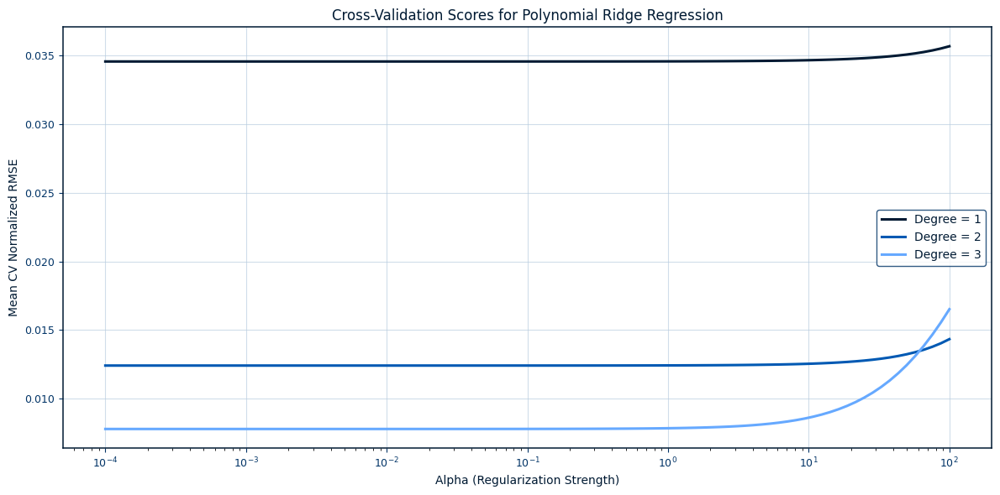

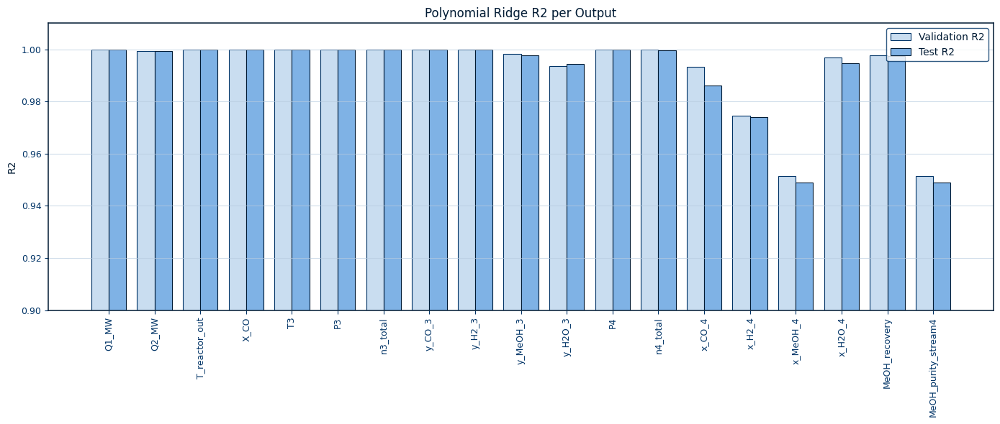

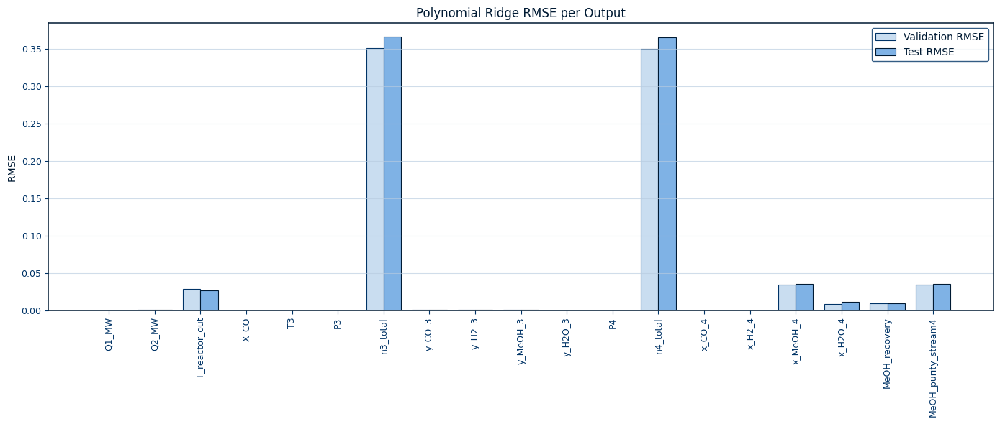

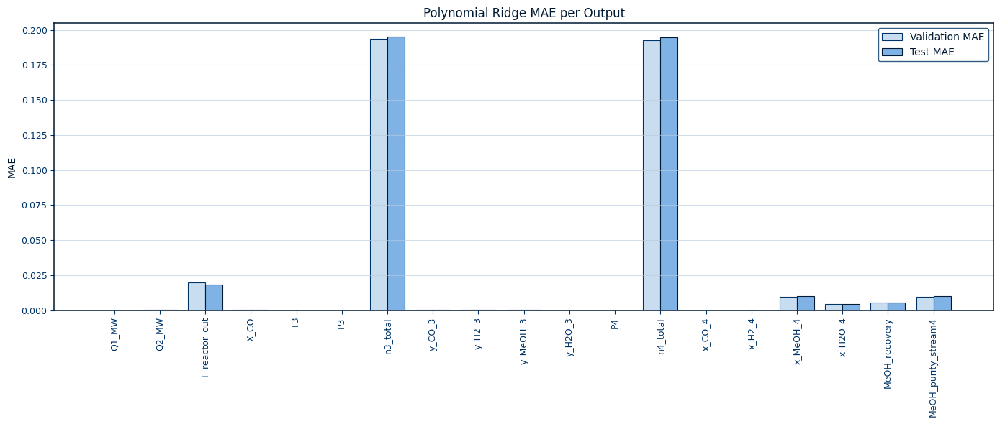

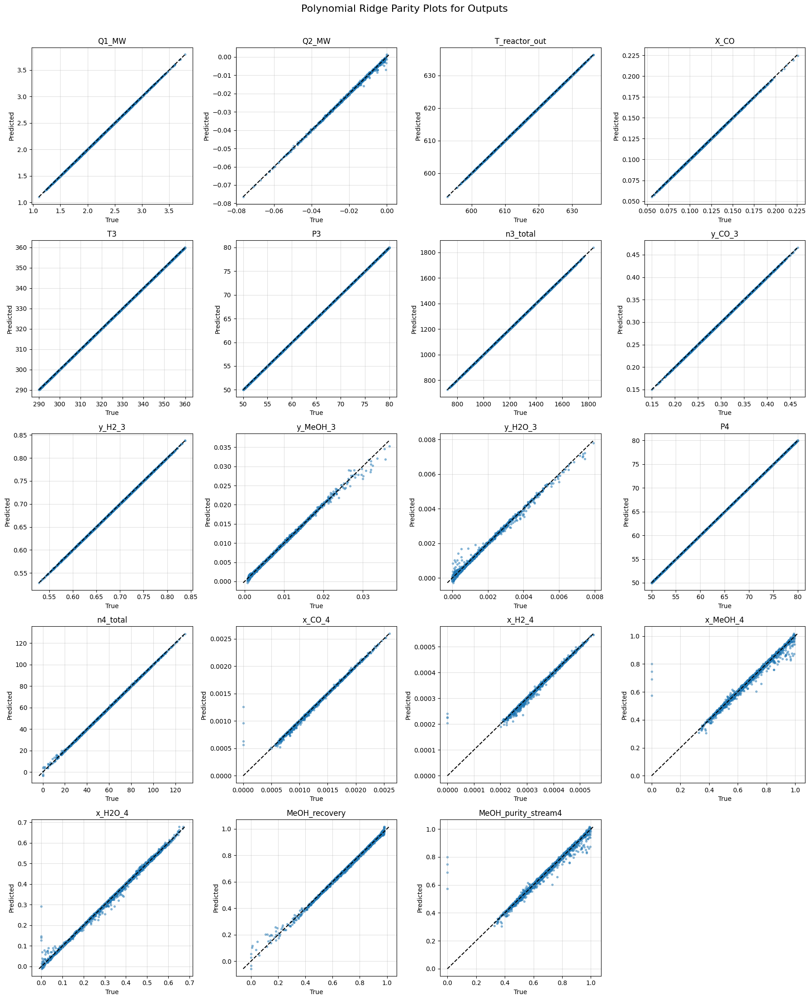

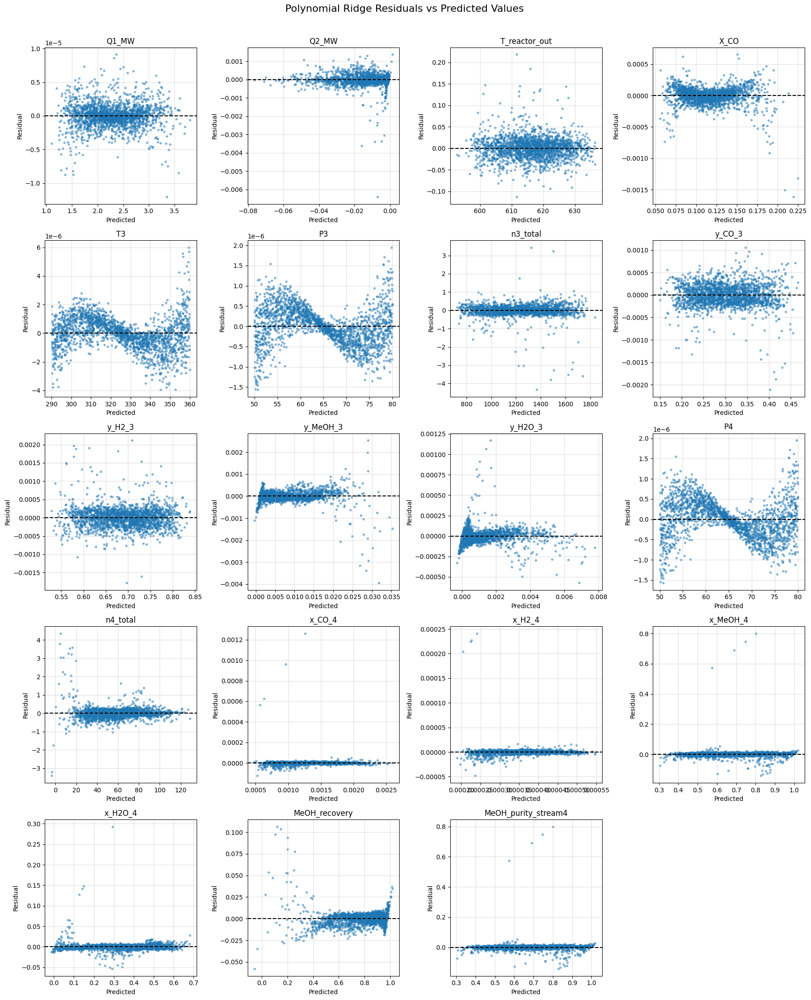

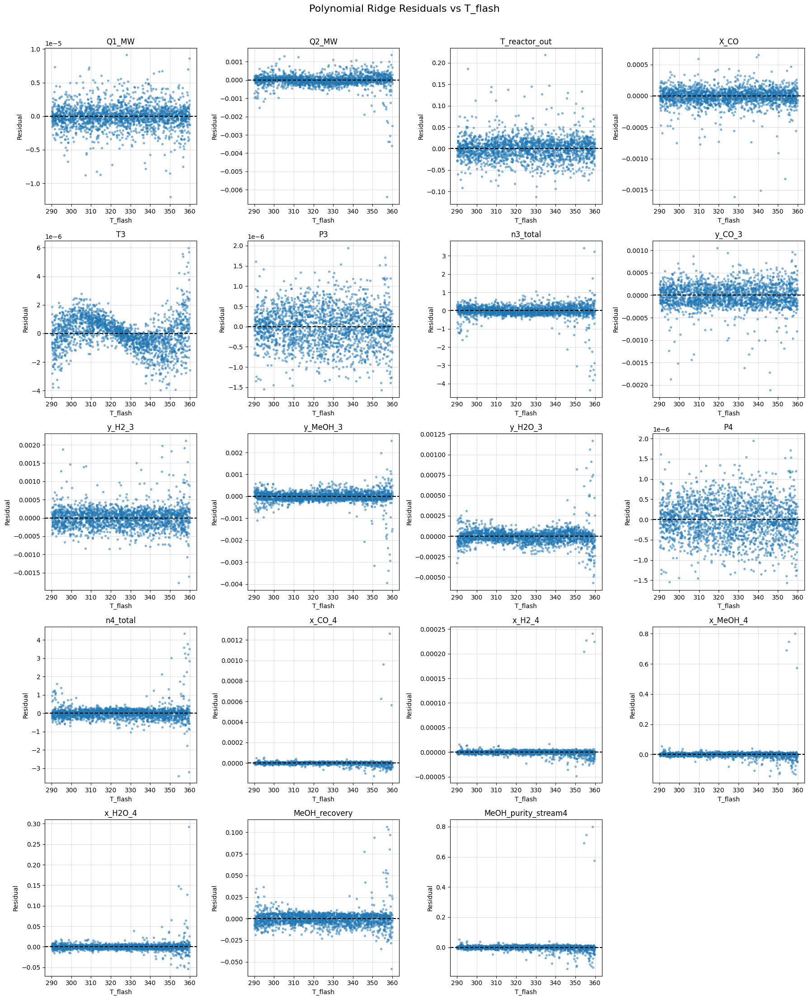

In [6]:
# Data set preparaation for baseline model

X_full = X_train.copy()
y_full = y_train.copy()

X_tr, X_val, y_tr, y_val = train_test_split(
    X_full,
    y_full,
    test_size=0.20,
    random_state=42,
    shuffle=True
)

# Customiazation of the evaluation metric:
# We are creating a custom scorer for GridSearchCV that computes the mean normalized RMSE across all output variables.
# The normalization is done by dividing the RMSE of each output by the range of that output in the training set.

def mean_normalized_rmse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    rmse = np.sqrt(np.mean((y_true - y_pred) ** 2, axis=0))

    y_range = np.max(y_true, axis=0) - np.min(y_true, axis=0)
    y_range = np.where(y_range == 0, 1.0, y_range)  # Avoid division by zero for constant outputs

    nrmse = rmse / y_range

    # GridSearchCV maximizes the score, therefore return negative error
    return -np.mean(nrmse)

nrmse_scorer = make_scorer(
    mean_normalized_rmse,
    greater_is_better=True
) 

# Prepare names
output_names_list = list(output_names)
input_names_list = list(input_names)


# Table: number of polynomial features for each degree
degrees_to_check = [1, 2, 3]
feature_count_rows = []
for degree in degrees_to_check:
    poly_tmp = PolynomialFeatures(degree=degree, include_bias=False)
    poly_tmp.fit(np.zeros((1, n_inputs)))

    feature_count_rows.append({
        "Degree": degree,
        "Number of polynomial features": poly_tmp.n_output_features_
    })
feature_count_table = pd.DataFrame(feature_count_rows)

print("Feature count per degree:")
display(feature_count_table)


# Polynomial Ridge pipeline
# We are introducing pipeline to creat automatic order of actions
# StandartScaler is standartizing the inputs
# PolinomialFeatures is creating the polynomial features (combinations of the original input parameters)
# Ridge is regularizing the regression

base_model = Pipeline([
    ("x_scaler", StandardScaler()),
    ("poly", PolynomialFeatures(include_bias=False)),
    ("ridge", Ridge())
])

# TransformedTargetRegressor is standardizing the outputs
poly_ridge_model = TransformedTargetRegressor(
    regressor=base_model,
    transformer=StandardScaler()
)

# Hyperparameter grid

alphas = np.logspace(-4, 2, 100)
param_grid = {
    "regressor__poly__degree": [1, 2, 3],
    "regressor__ridge__alpha": alphas
}


# GridSearch with cross-validation 
# Employed to find the best combination of polynomial degree and ridge regularization strength
# CV is set to 5 folds of cross validation
# Scoring is done with custo mean NRMSE 

grid = GridSearchCV(
    estimator=poly_ridge_model,
    param_grid=param_grid,
    scoring=nrmse_scorer,
    cv=5,
    n_jobs=-1,
    return_train_score=True
)

grid.fit(X_tr, y_tr)

print("Best parameters:")
print(grid.best_params_)

print("\nBest CV score:")
print(grid.best_score_)

# Validation set evaluation

best_poly_ridge = grid.best_estimator_
y_val_pred = best_poly_ridge.predict(X_val)

mae_val = mean_absolute_error(
    y_val,
    y_val_pred,
    multioutput="raw_values"
)

rmse_val = np.sqrt(mean_squared_error(
    y_val,
    y_val_pred,
    multioutput="raw_values"
))

r2_val = r2_score(
    y_val,
    y_val_pred,
    multioutput="raw_values"
)


# Retrain final model on full train.csv

best_degree = grid.best_params_["regressor__poly__degree"]
best_alpha = grid.best_params_["regressor__ridge__alpha"]

final_poly_ridge = TransformedTargetRegressor(
    regressor=Pipeline([
        ("x_scaler", StandardScaler()),
        ("poly", PolynomialFeatures(
            degree=best_degree,
            include_bias=False
        )),
        ("ridge", Ridge(alpha=best_alpha))
    ]),
    transformer=StandardScaler()
)

final_poly_ridge.fit(X_full, y_full)

print("\nFinal Polynomial Ridge model trained on full train.csv")
print("Polynomial degree:", best_degree)
print("Ridge alpha:", best_alpha)


# Final test set evaluation
y_test_pred = final_poly_ridge.predict(X_test)

mae_test = mean_absolute_error(
    y_test,
    y_test_pred,
    multioutput="raw_values"
)

rmse_test = np.sqrt(mean_squared_error(
    y_test,
    y_test_pred,
    multioutput="raw_values"
))

r2_test = r2_score(
    y_test,
    y_test_pred,
    multioutput="raw_values"
)


# Combined validation and test results table
combined_results = pd.DataFrame({
    "Output": output_names,
    "MAE_val": mae_val,
    "MAE_test": mae_test,
    "RMSE_val": rmse_val,
    "RMSE_test": rmse_test,
    "R2_val": r2_val,
    "R2_test": r2_test
})

combined_results_display = combined_results.copy()

for col in ["MAE_val", "MAE_test", "RMSE_val", "RMSE_test"]:
    combined_results_display[col] = combined_results_display[col].map(lambda x: float(f"{x:.6g}"))

for col in ["R2_val", "R2_test"]:
    combined_results_display[col] = combined_results_display[col].map(lambda x: float(f"{x:.5f}"))

print("\nCombined validation and test results:")
display(combined_results_display)


# Average metrics table
average_metrics = pd.DataFrame({
    "Dataset": ["Validation", "Test"],
    "Mean MAE": [np.mean(mae_val), np.mean(mae_test)],
    "Mean RMSE": [np.mean(rmse_val), np.mean(rmse_test)],
    "Mean R2": [np.mean(r2_val), np.mean(r2_test)],
    "Median R2": [np.median(r2_val), np.median(r2_test)],
    "Minimum R2": [np.min(r2_val), np.min(r2_test)]
})

average_metrics_display = average_metrics.copy()

for col in ["Mean MAE", "Mean RMSE"]:
    average_metrics_display[col] = average_metrics_display[col].map(lambda x: float(f"{x:.6g}"))

for col in ["Mean R2", "Median R2", "Minimum R2"]:
    average_metrics_display[col] = average_metrics_display[col].map(lambda x: float(f"{x:.5f}"))

print("\nAverage metrics:")
display(average_metrics_display)


# Table with all polynomial features for the best degree
poly_best = PolynomialFeatures(
    degree=best_degree,
    include_bias=False
)

poly_best.fit(np.zeros((1, n_inputs)))
best_feature_names = poly_best.get_feature_names_out(input_names_list)

all_features_table = pd.DataFrame({
    "Feature index": np.arange(1, len(best_feature_names) + 1),
    "Feature name": best_feature_names
})

print(f"\nAll polynomial features for best degree = {best_degree}:")
display(all_features_table)


# Cross-validation curve

cv_results = pd.DataFrame(grid.cv_results_)
plt.figure(figsize=(12, 6))
ax = plt.gca()

degree_colors = {
    1: "#001a33",
    2: "#0059b3",
    3: "#66a9ff"
}



for degree in sorted(cv_results["param_regressor__poly__degree"].unique()):

    subset = cv_results[
        cv_results["param_regressor__poly__degree"] == degree
    ].copy()

    subset["alpha"] = subset["param_regressor__ridge__alpha"].astype(float)
    subset = subset.sort_values("alpha")

    alphas_plot = subset["alpha"].to_numpy()
    cv_nrmse = (-subset["mean_test_score"]).to_numpy()

    plt.plot(
        alphas_plot,
        cv_nrmse,
        color=degree_colors[int(degree)],
        markevery=10,
        markersize=5,
        linewidth=2.2,
        label=f"Degree = {degree}"
    )

plt.xscale("log")

major_ticks = [1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]
plt.xticks(major_ticks)

plt.xlabel("Alpha (Regularization Strength)", color="#001a33")
plt.ylabel("Mean CV Normalized RMSE", color="#001a33")
plt.title("Cross-Validation Scores for Polynomial Ridge Regression", color="#001a33")

ax.tick_params(axis="both", colors="#003366", labelsize=9)

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("#001a33")
    spine.set_linewidth(1.1)

ax.grid(
    True,
    which="major",
    color="#b8cce0",
    alpha=0.65,
    linewidth=0.8
)

legend = plt.legend(
    frameon=True,
    facecolor="white",
    edgecolor="#003366"
)

for text in legend.get_texts():
    text.set_color("#001a33")

plt.tight_layout()
plt.show()


# R2 comparison: validation vs test

x_pos = np.arange(len(output_names_list))
width = 0.38

plt.figure(figsize=(14, 6))
ax = plt.gca()

plt.bar(
    x_pos - width / 2,
    r2_val,
    width=width,
    color="#c9ddf0",
    edgecolor="#003366",
    linewidth=0.8,
    label="Validation R2"
)

plt.bar(
    x_pos + width / 2,
    r2_test,
    width=width,
    color="#7fb2e5",
    edgecolor="#001a33",
    linewidth=0.8,
    label="Test R2"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("R2", color="#001a33")
plt.title("Polynomial Ridge R2 per Output", color="#001a33")
plt.ylim(0.90, 1.01)

ax.tick_params(axis="both", colors="#003366", labelsize=9)

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("#001a33")
    spine.set_linewidth(1.1)

ax.grid(
    True,
    axis="y",
    color="#b8cce0",
    alpha=0.65,
    linewidth=0.8
)

legend = plt.legend(
    frameon=True,
    facecolor="white",
    edgecolor="#003366"
)

for text in legend.get_texts():
    text.set_color("#001a33")

plt.tight_layout()
plt.show()


# RMSE comparison: validation vs test

plt.figure(figsize=(14, 6))
ax = plt.gca()

plt.bar(
    x_pos - width / 2,
    rmse_val,
    width=width,
    color="#c9ddf0",
    edgecolor="#003366",
    linewidth=0.8,
    label="Validation RMSE"
)

plt.bar(
    x_pos + width / 2,
    rmse_test,
    width=width,
    color="#7fb2e5",
    edgecolor="#001a33",
    linewidth=0.8,
    label="Test RMSE"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("RMSE", color="#001a33")
plt.title("Polynomial Ridge RMSE per Output", color="#001a33")

ax.tick_params(axis="both", colors="#003366", labelsize=9)

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("#001a33")
    spine.set_linewidth(1.1)

ax.grid(
    True,
    axis="y",
    color="#b8cce0",
    alpha=0.65,
    linewidth=0.8
)

legend = plt.legend(
    frameon=True,
    facecolor="white",
    edgecolor="#003366"
)

for text in legend.get_texts():
    text.set_color("#001a33")

plt.tight_layout()
plt.show()


# MAE comparison: validation vs test

plt.figure(figsize=(14, 6))
ax = plt.gca()

plt.bar(
    x_pos - width / 2,
    mae_val,
    width=width,
    color="#c9ddf0",
    edgecolor="#003366",
    linewidth=0.8,
    label="Validation MAE"
)

plt.bar(
    x_pos + width / 2,
    mae_test,
    width=width,
    color="#7fb2e5",
    edgecolor="#001a33",
    linewidth=0.8,
    label="Test MAE"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("MAE", color="#001a33")
plt.title("Polynomial Ridge MAE per Output", color="#001a33")

ax.tick_params(axis="both", colors="#003366", labelsize=9)

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("#001a33")
    spine.set_linewidth(1.1)

ax.grid(
    True,
    axis="y",
    color="#b8cce0",
    alpha=0.65,
    linewidth=0.8
)

legend = plt.legend(
    frameon=True,
    facecolor="white",
    edgecolor="#003366"
)

for text in legend.get_texts():
    text.set_color("#001a33")

plt.tight_layout()
plt.show()

# Parity plots for all outputs
n_cols = 4
n_rows = int(np.ceil(n_outputs / n_cols))
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.5 * n_cols, 4.5 * n_rows)
)
axes = axes.flatten()
for i, output in enumerate(output_names_list):
    ax = axes[i]
    y_true = y_test[:, i]
    y_pred = y_test_pred[:, i]
    ax.scatter(y_true, y_pred, s=8, alpha=0.45)
    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    ax.plot(
        [min_val, max_val],
        [min_val, max_val],
        "k--",
        linewidth=1.5
    )
    ax.set_title(output)
    ax.set_xlabel("True")
    ax.set_ylabel("Predicted")
    ax.grid(True, alpha=0.4)
for j in range(n_outputs, len(axes)):
    axes[j].axis("off")
fig.suptitle("Polynomial Ridge Parity Plots for Outputs", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


# Residual plots vs predicted value for all outputs
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.5 * n_cols, 4.5 * n_rows)
)
axes = axes.flatten()
for i, output in enumerate(output_names_list):
    ax = axes[i]
    y_true = y_test[:, i]
    y_pred = y_test_pred[:, i]
    residual = y_pred - y_true
    ax.scatter(y_pred, residual, s=8, alpha=0.45)
    ax.axhline(0, color="k", linestyle="--", linewidth=1.5)
    ax.set_title(output)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Residual")
    ax.grid(True, alpha=0.4)
for j in range(n_outputs, len(axes)):
    axes[j].axis("off")
fig.suptitle("Polynomial Ridge Residuals vs Predicted Values", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# Residual plots vs T_flash for all outputs
if "T_flash" in input_names_list:
    T_flash_idx = input_names_list.index("T_flash")
else:
    T_flash_idx = 7
T_flash_test = X_test[:, T_flash_idx]
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.5 * n_cols, 4.5 * n_rows)
)
axes = axes.flatten()
for i, output in enumerate(output_names_list):
    ax = axes[i]
    y_true = y_test[:, i]
    y_pred = y_test_pred[:, i]
    residual = y_pred - y_true
    ax.scatter(T_flash_test, residual, s=8, alpha=0.45)
    ax.axhline(0, color="k", linestyle="--", linewidth=1.5)
    ax.set_title(output)
    ax.set_xlabel("T_flash")
    ax.set_ylabel("Residual")
    ax.grid(True, alpha=0.4)
for j in range(n_outputs, len(axes)):
    axes[j].axis("off")
fig.suptitle("Polynomial Ridge Residuals vs T_flash", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

HYBRID POLYNOMIAL RIDGE + MLP 

Best Polynomial Ridge parameters:
Degree: 3
Alpha: 0.0001
Best CV score: -0.007794270955048049

Residual training target shape: (6400, 19)

Using device: cpu

Residual correction neural network:
ResidualCorrectionNN(
  (net): Sequential(
    (0): Linear(in_features=9, out_features=64, bias=True)
    (1): SiLU()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): SiLU()
    (4): Linear(in_features=64, out_features=19, bias=True)
  )
)
Epoch   50 | Train loss: 6.874093e-01 | Val loss: 8.272945e-01
Epoch  100 | Train loss: 4.592184e-01 | Val loss: 6.142309e-01
Epoch  150 | Train loss: 3.309212e-01 | Val loss: 4.905467e-01
Epoch  200 | Train loss: 2.427473e-01 | Val loss: 4.191698e-01
Epoch  250 | Train loss: 1.882601e-01 | Val loss: 3.946812e-01
Epoch  300 | Train loss: 1.503026e-01 | Val loss: 3.830687e-01
Epoch  350 | Train loss: 1.398365e-01 | Val loss: 3.802775e-01
Epoch  400 | Train loss: 1.368129e-01 | Val loss: 3.794509e-01

Early stopping at epoch 402

Best valida

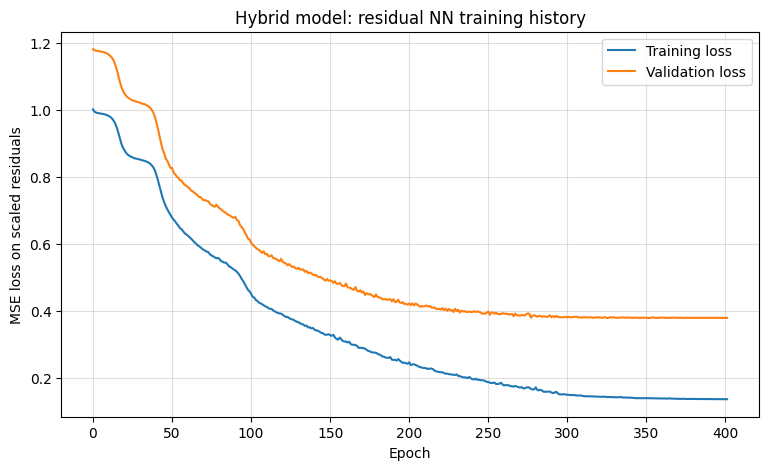


Hybrid model validation and test results:


,Output,MAE_val,MAE_test,RMSE_val,RMSE_test,R2_val,R2_test
0,Q1_MW,5.429367e-07,5.499326e-07,7.550022e-07,7.694169e-07,1.000000,1.000000
1,Q2_MW,7.662324e-05,7.721025e-05,1.755705e-04,1.577156e-04,0.999805,0.999850
2,T_reactor_out,1.135660e-02,1.152593e-02,1.650193e-02,1.622582e-02,0.999996,0.999996
3,X_CO,5.971351e-05,6.375499e-05,8.626769e-05,9.799559e-05,0.999989,0.999988
4,T3,2.800649e-07,2.838178e-07,3.885319e-07,3.863164e-07,1.000000,1.000000
5,P3,9.250673e-08,9.585104e-08,1.276615e-07,1.291016e-07,1.000000,1.000000
6,n3_total,6.429928e-02,6.074057e-02,2.323788e-01,1.663137e-01,0.999999,0.999999
7,y_CO_3,7.886224e-05,7.749096e-05,1.181970e-04,1.095566e-04,0.999996,0.999997
8,y_H2_3,8.442546e-05,8.411979e-05,1.448459e-04,1.302904e-04,0.999995,0.999996
9,y_MeOH_3,4.783148e-05,4.566852e-05,1.269813e-04,1.062385e-04,0.999607,0.999715



Hybrid model average metrics:


,Dataset,Mean MAE,Mean RMSE,Mean R2,Median R2,Minimum R2
0,Validation,0.008114,0.028576,0.995940,0.999896,0.972284
1,Test,0.007791,0.022344,0.993409,0.999946,0.957340


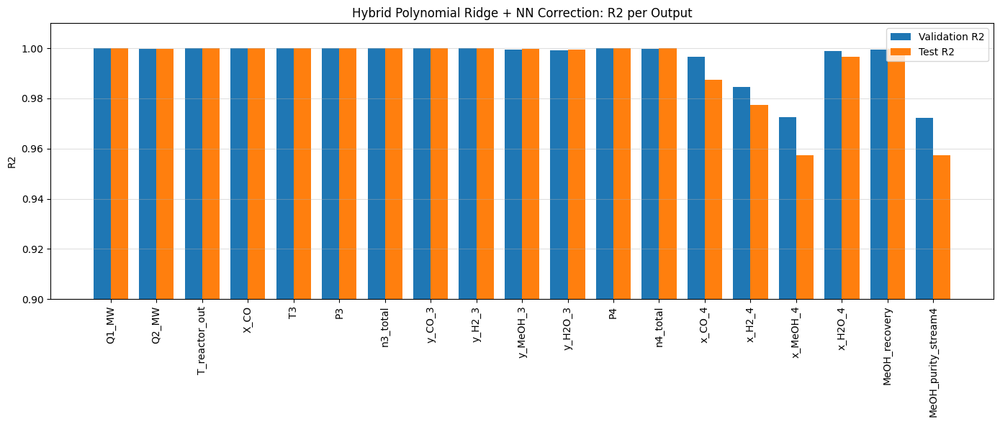

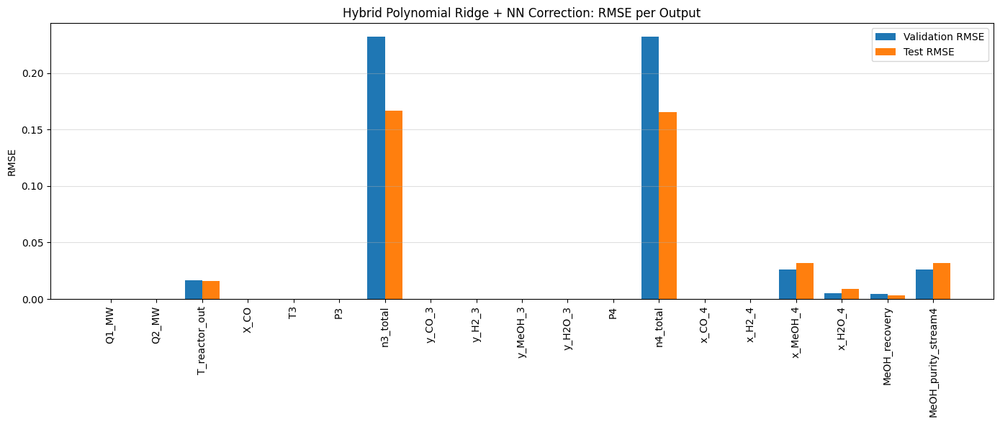

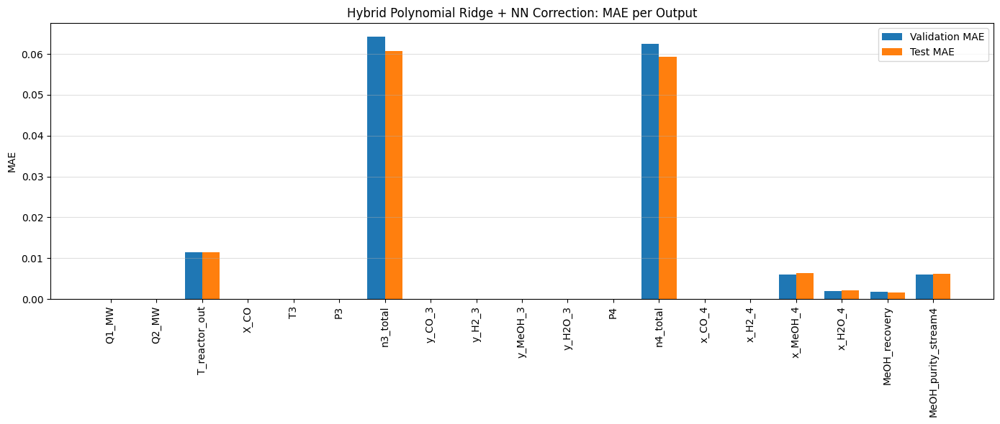

In [ ]:
# Data set preparation for hybrid model

X_full = X_train.copy()
y_full = y_train.copy()

X_tr, X_val, y_tr, y_val = train_test_split(
    X_full,
    y_full,
    test_size=0.20,
    random_state=42,
    shuffle=True
)

output_names_list = list(output_names)
input_names_list = list(input_names)


# Customization of the evaluation metric:
# We are creating a custom scorer for GridSearchCV that computes the mean normalized RMSE across all output variables.
# The normalization is done by dividing the RMSE of each output by the range of that output.

def mean_normalized_rmse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    rmse = np.sqrt(np.mean((y_true - y_pred) ** 2, axis=0))

    y_range = np.max(y_true, axis=0) - np.min(y_true, axis=0)
    y_range = np.where(y_range == 0, 1.0, y_range)  # Avoid division by zero for constant outputs

    nrmse = rmse / y_range

    # GridSearchCV maximizes the score, therefore return negative error
    return -np.mean(nrmse)


nrmse_scorer = make_scorer(
    mean_normalized_rmse,
    greater_is_better=True
)


# Polynomial Ridge part of the hybrid architecture
# The Polynomial Ridge model is used to capture the main smooth nonlinear trend of the process.
# Later, the neural network will be trained only on the residual errors of this Polynomial Ridge model.

poly_base_model = Pipeline([
    ("x_scaler", StandardScaler()),
    ("poly", PolynomialFeatures(include_bias=False)),
    ("ridge", Ridge())
])

poly_ridge_model = TransformedTargetRegressor(
    regressor=poly_base_model,
    transformer=StandardScaler()
)


# Hyperparameter grid for Polynomial Ridge

alphas = np.logspace(-4, 2, 100)

param_grid = {
    "regressor__poly__degree": [1, 2, 3],
    "regressor__ridge__alpha": alphas
}


# GridSearch with cross-validation for Polynomial Ridge
# Employed to find the best combination of polynomial degree and ridge regularization strength.
# CV is set to 5 folds of cross-validation.
# Scoring is done with custom mean normalized RMSE.

grid = GridSearchCV(
    estimator=poly_ridge_model,
    param_grid=param_grid,
    scoring=nrmse_scorer,
    cv=5,
    n_jobs=-1,
    return_train_score=True
)

grid.fit(X_tr, y_tr)

best_poly_model = grid.best_estimator_

best_degree = grid.best_params_["regressor__poly__degree"]
best_alpha = grid.best_params_["regressor__ridge__alpha"]

print("Best Polynomial Ridge parameters:")
print("Polynomial degree:", best_degree)
print("Ridge alpha:", best_alpha)

print("\nBest Polynomial Ridge CV score:")
print(grid.best_score_)


# Polynomial Ridge predictions
# These predictions represent the baseline part of the hybrid architecture.

y_poly_tr = best_poly_model.predict(X_tr)
y_poly_val = best_poly_model.predict(X_val)
y_poly_test = best_poly_model.predict(X_test)


# Residual target calculation
# The neural network is not trained to predict the full output directly.
# Instead, it is trained to predict the residual error of the Polynomial Ridge model.

res_tr = y_tr - y_poly_tr
res_val = y_val - y_poly_val

print("\nResidual target shape:")
print("Training residuals:", res_tr.shape)
print("Validation residuals:", res_val.shape)


# Scaling for neural network
# Inputs are standardized for neural network training.
# Residuals are also standardized because residuals of different outputs may have different numerical scales.

x_scaler_nn = StandardScaler()
res_scaler_nn = StandardScaler()

X_tr_scaled = x_scaler_nn.fit_transform(X_tr)
X_val_scaled = x_scaler_nn.transform(X_val)
X_test_scaled = x_scaler_nn.transform(X_test)

res_tr_scaled = res_scaler_nn.fit_transform(res_tr)
res_val_scaled = res_scaler_nn.transform(res_val)


# PyTorch tensor preparation

torch.manual_seed(42)
np.random.seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("\nUsing device:", device)

X_tr_tensor = torch.tensor(X_tr_scaled, dtype=torch.float32)
res_tr_tensor = torch.tensor(res_tr_scaled, dtype=torch.float32)

X_val_tensor = torch.tensor(X_val_scaled, dtype=torch.float32).to(device)
res_val_tensor = torch.tensor(res_val_scaled, dtype=torch.float32).to(device)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)

train_dataset = TensorDataset(
    X_tr_tensor,
    res_tr_tensor
)

train_loader = DataLoader(
    train_dataset,
    batch_size=256,
    shuffle=True
)


# Neural network correction model
# This network learns the residual correction:
# residual = y_true - y_poly
# Final hybrid prediction:
# y_hybrid = y_poly + residual_NN

class ResidualCorrectionNN(nn.Module):
    def __init__(self, n_inputs, n_outputs):
        super().__init__()

        self.net = nn.Sequential(
            nn.Linear(n_inputs, 64),
            nn.SiLU(),

            nn.Linear(64, 64),
            nn.SiLU(),

            nn.Linear(64, n_outputs)
        )

    def forward(self, x):
        return self.net(x)


residual_nn = ResidualCorrectionNN(
    n_inputs=n_inputs,
    n_outputs=n_outputs
).to(device)

print("\nResidual correction neural network:")
print(residual_nn)


# Neural network training setup
# MSELoss is applied to scaled residuals.
# AdamW is used as optimizer with a small weight decay for regularization.
# ReduceLROnPlateau decreases learning rate when validation loss stops improving.
# Early stopping avoids overfitting.

criterion = nn.MSELoss()

optimizer = torch.optim.AdamW(
    residual_nn.parameters(),
    lr=1e-3,
    weight_decay=1e-5
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=15
)

max_epochs = 1000
early_stopping_patience = 50

best_val_loss = np.inf
best_model_state = None
epochs_without_improvement = 0

train_loss_history = []
val_loss_history = []


# Training loop for neural residual correction model

for epoch in range(max_epochs):

    residual_nn.train()
    batch_losses = []

    for X_batch, res_batch in train_loader:

        X_batch = X_batch.to(device)
        res_batch = res_batch.to(device)

        optimizer.zero_grad()

        res_pred_batch = residual_nn(X_batch)
        loss = criterion(res_pred_batch, res_batch)

        loss.backward()
        optimizer.step()

        batch_losses.append(loss.item())

    train_loss = np.mean(batch_losses)

    residual_nn.eval()

    with torch.no_grad():
        res_val_pred_scaled = residual_nn(X_val_tensor)
        val_loss = criterion(res_val_pred_scaled, res_val_tensor).item()

    scheduler.step(val_loss)

    train_loss_history.append(train_loss)
    val_loss_history.append(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = {
            key: value.detach().cpu().clone()
            for key, value in residual_nn.state_dict().items()
        }
        epochs_without_improvement = 0
    else:
        epochs_without_improvement += 1

    if (epoch + 1) % 50 == 0:
        print(
            f"Epoch {epoch + 1:4d} | "
            f"Train loss: {train_loss:.6e} | "
            f"Val loss: {val_loss:.6e}"
        )

    if epochs_without_improvement >= early_stopping_patience:
        print(f"\nEarly stopping at epoch {epoch + 1}")
        break


# Load best neural network weights

residual_nn.load_state_dict(best_model_state)

print("\nBest validation loss for residual correction NN:")
print(best_val_loss)


# Training history plot

plt.figure(figsize=(9, 5))

plt.plot(
    train_loss_history,
    label="Training loss",
    linewidth=2
)

plt.plot(
    val_loss_history,
    label="Validation loss",
    linewidth=2
)

plt.xlabel("Epoch")
plt.ylabel("MSE loss on scaled residuals")
plt.title("Hybrid Model: Residual Neural Network Training History")
plt.grid(True, alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# Neural network residual prediction
# The neural network predicts scaled residuals.
# Then the residuals are transformed back to original physical units.

residual_nn.eval()

with torch.no_grad():
    res_val_pred_scaled = residual_nn(X_val_tensor).cpu().numpy()
    res_test_pred_scaled = residual_nn(X_test_tensor).cpu().numpy()

res_val_pred = res_scaler_nn.inverse_transform(res_val_pred_scaled)
res_test_pred = res_scaler_nn.inverse_transform(res_test_pred_scaled)


# Final hybrid predictions
# Final hybrid prediction is obtained by adding the NN residual correction to the Polynomial Ridge prediction.

y_hybrid_val_pred = y_poly_val + res_val_pred
y_hybrid_test_pred = y_poly_test + res_test_pred


# Validation set evaluation for hybrid model

mae_val = mean_absolute_error(
    y_val,
    y_hybrid_val_pred,
    multioutput="raw_values"
)

rmse_val = np.sqrt(mean_squared_error(
    y_val,
    y_hybrid_val_pred,
    multioutput="raw_values"
))

r2_val = r2_score(
    y_val,
    y_hybrid_val_pred,
    multioutput="raw_values"
)


# Final test set evaluation for hybrid model

mae_test = mean_absolute_error(
    y_test,
    y_hybrid_test_pred,
    multioutput="raw_values"
)

rmse_test = np.sqrt(mean_squared_error(
    y_test,
    y_hybrid_test_pred,
    multioutput="raw_values"
))

r2_test = r2_score(
    y_test,
    y_hybrid_test_pred,
    multioutput="raw_values"
)


# Combined validation and test results table

hybrid_results = pd.DataFrame({
    "Output": output_names,
    "MAE_val": mae_val,
    "MAE_test": mae_test,
    "RMSE_val": rmse_val,
    "RMSE_test": rmse_test,
    "R2_val": r2_val,
    "R2_test": r2_test
})

hybrid_results_display = hybrid_results.copy()

for col in ["MAE_val", "MAE_test", "RMSE_val", "RMSE_test"]:
    hybrid_results_display[col] = hybrid_results_display[col].map(lambda x: float(f"{x:.6g}"))

for col in ["R2_val", "R2_test"]:
    hybrid_results_display[col] = hybrid_results_display[col].map(lambda x: float(f"{x:.5f}"))

print("\nHybrid model combined validation and test results:")
display(hybrid_results_display)


# Average metrics table

hybrid_average_metrics = pd.DataFrame({
    "Dataset": ["Validation", "Test"],
    "Mean MAE": [np.mean(mae_val), np.mean(mae_test)],
    "Mean RMSE": [np.mean(rmse_val), np.mean(rmse_test)],
    "Mean R2": [np.mean(r2_val), np.mean(r2_test)],
    "Median R2": [np.median(r2_val), np.median(r2_test)],
    "Minimum R2": [np.min(r2_val), np.min(r2_test)]
})

hybrid_average_metrics_display = hybrid_average_metrics.copy()

for col in ["Mean MAE", "Mean RMSE"]:
    hybrid_average_metrics_display[col] = hybrid_average_metrics_display[col].map(lambda x: float(f"{x:.6g}"))

for col in ["Mean R2", "Median R2", "Minimum R2"]:
    hybrid_average_metrics_display[col] = hybrid_average_metrics_display[col].map(lambda x: float(f"{x:.5f}"))

print("\nHybrid model average metrics:")
display(hybrid_average_metrics_display)


# R2 comparison: validation vs test

x_pos = np.arange(len(output_names_list))
width = 0.38

plt.figure(figsize=(14, 6))

plt.bar(
    x_pos - width / 2,
    r2_val,
    width=width,
    label="Validation R2"
)

plt.bar(
    x_pos + width / 2,
    r2_test,
    width=width,
    label="Test R2"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("R2")
plt.title("Hybrid Polynomial Ridge + Neural Correction: R2 per Output")
plt.ylim(0.90, 1.01)
plt.grid(axis="y", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# RMSE comparison: validation vs test

plt.figure(figsize=(14, 6))

plt.bar(
    x_pos - width / 2,
    rmse_val,
    width=width,
    label="Validation RMSE"
)

plt.bar(
    x_pos + width / 2,
    rmse_test,
    width=width,
    label="Test RMSE"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("RMSE")
plt.title("Hybrid Polynomial Ridge + Neural Correction: RMSE per Output")
plt.grid(axis="y", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# MAE comparison: validation vs test

plt.figure(figsize=(14, 6))

plt.bar(
    x_pos - width / 2,
    mae_val,
    width=width,
    label="Validation MAE"
)

plt.bar(
    x_pos + width / 2,
    mae_test,
    width=width,
    label="Test MAE"
)

plt.xticks(x_pos, output_names_list, rotation=90)
plt.ylabel("MAE")
plt.title("Hybrid Polynomial Ridge + Neural Correction: MAE per Output")
plt.grid(axis="y", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()